<a href="https://colab.research.google.com/github/jacqueline-chung/BigDataAnalytics/blob/master/Jacqueline_Chung_ITM_760_Course_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [ ]:
# Our goal is to apply different machine learning on a particular dataset
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from pandas import read_csv
from pandas.plotting import scatter_matrix
import pylab as pl

# Import for sorting
import heapq

# Import for z-score
from scipy import stats

# Import for One Hot Vector

# Sklearn 
from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

# Keras
from numpy import array
from numpy import argmax
from keras.utils import to_categorical

# Import libraries for correlation analysis
import seaborn as sns
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# For splitting data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Import for information gain
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
import pprint
from heapq import nlargest
from operator import itemgetter

# For charts
# Seaborn visualization library
import seaborn as sns

# Import libraries for classifiers
from sklearn.model_selection import train_test_split
from sklearn.metrics import  classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Import libraries for Regressors
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# Import for median
import statistics

#use this section to mount your google drive to your google colab
#this an important practice for using large files
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

#get the id of your file by right click on it on your google drive 
#https://drive.google.com/open?id=1Bo3FvCzERgFuF61ECdj3peKnCJojth88
downloaded = drive.CreateFile({'id':'1Bo3FvCzERgFuF61ECdj3peKnCJojth88'}) 
downloaded.GetContentFile('news.csv')  

# https://drive.google.com/open?id=1WrcsyUrVgZUClNSby6mWdUzeUDVM72lh
downloaded = drive.CreateFile({'id':'1WrcsyUrVgZUClNSby6mWdUzeUDVM72lh'}) 
downloaded.GetContentFile('shop.csv')  

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# **News Dataset**

In [ ]:
# Read dataset and create a dataframe
news = pd.read_csv('news.csv')

In [ ]:
# Define the variables
news_df = news[news.columns]
share_df = news[news.columns[-1]]
share = news.columns[-1]

## Remove Spaces for Feature Names

The names for each feature has a space before, so those wil be removed.

In [ ]:
news.columns

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

In [ ]:
# Remove space in front of the feature names
news.columns = news.columns.str.lstrip()
news.columns

Index(['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
     

## Explore Target Class

In [ ]:
# Descriptive statistics summary for all data 
share_df.describe()

# This seems that the minimum and max are drastically different, but at least it's above 0

count     39644.000000
mean       3395.380184
std       11626.950749
min           1.000000
25%         946.000000
50%        1400.000000
75%        2800.000000
max      843300.000000
Name:  shares, dtype: float64

### Histogram

This shows:

* Deviate from the normal distribution.
* Have appreciable positive skewness.
* Show peakedness.

It seems that it's skewed to the lower end.

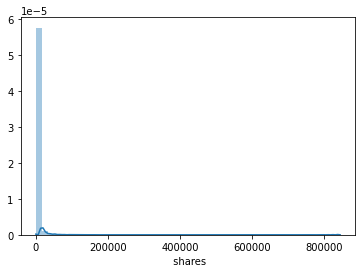

In [ ]:
# Print Histogram to see distribution
sns.distplot(share_df);

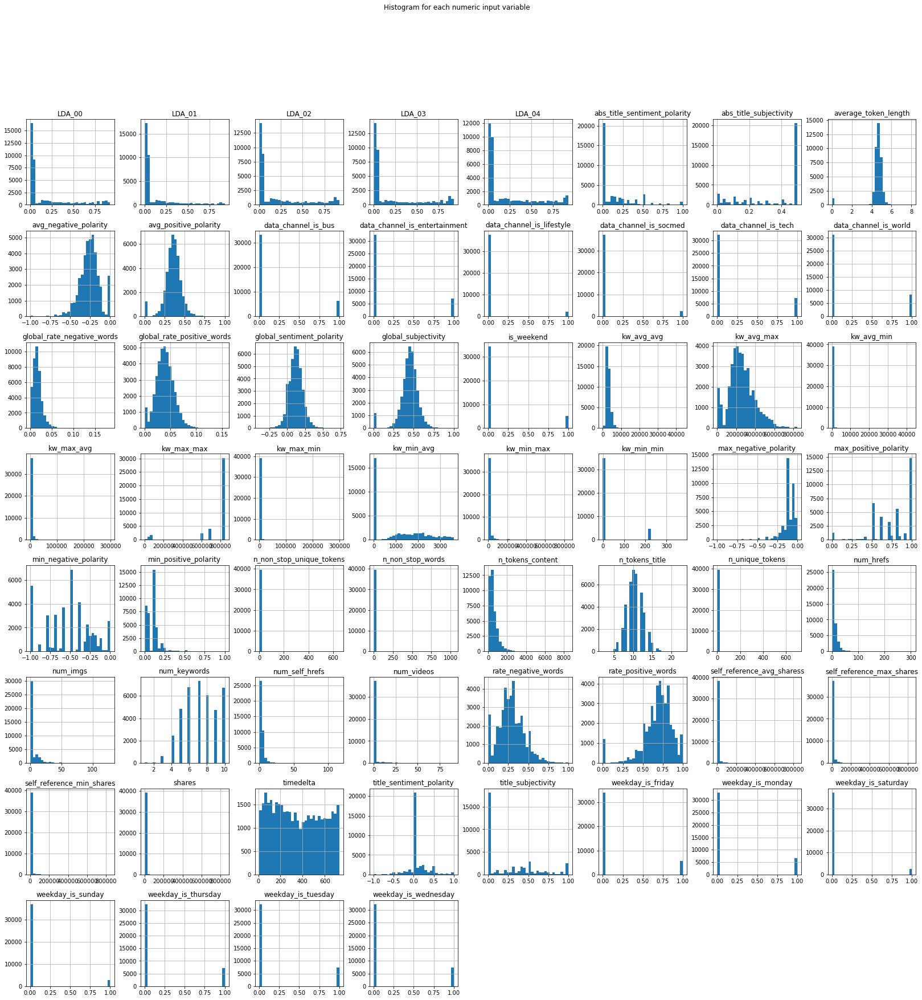

In [ ]:
# Print Histogram
news.hist(bins = 30, figsize = (28,28))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('news_hist')
plt.show()

### Skewness and Kurtosis

News has a large skewness (should I do something about this?)

Shoppers is less askewed.

In [ ]:
# Skewness and kurtosis
print("Skewness: %f" % share_df.skew())
print("Kurtosis: %f" % share_df.kurt())

Skewness: 33.963885
Kurtosis: 1832.672657


## Delete irelevant data

'url' is irrelevant since all the data is numerical

In [ ]:
# Exploratory analysis
print(news.shape)

# Delete url - it is not relevant, it's not categorical or numerical
print(news['url'].unique())
print(news.groupby('url').size())

(39644, 61)
['http://mashable.com/2013/01/07/amazon-instant-video-browser/'
 'http://mashable.com/2013/01/07/ap-samsung-sponsored-tweets/'
 'http://mashable.com/2013/01/07/apple-40-billion-app-downloads/' ...
 'http://mashable.com/2014/12/27/son-pays-off-mortgage/'
 'http://mashable.com/2014/12/27/ukraine-blasts/'
 'http://mashable.com/2014/12/27/youtube-channels-2015/']
url
http://mashable.com/2013/01/07/amazon-instant-video-browser/                             1
http://mashable.com/2013/01/07/ap-samsung-sponsored-tweets/                              1
http://mashable.com/2013/01/07/apple-40-billion-app-downloads/                           1
http://mashable.com/2013/01/07/astronaut-notre-dame-bcs/                                 1
http://mashable.com/2013/01/07/att-u-verse-apps/                                         1
                                                                                        ..
http://mashable.com/2014/12/27/samsung-app-autism/                          

In [ ]:
news.columns[0]

'url'

In [ ]:
news = news.drop(news.columns[0], axis=1) # remove 'url' variable
# Check the columns that 'url' is deleted
news.columns

Index(['timedelta', 'n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'glob

## Remove Outliers
IQR and z-score methodologies will be used.

In [ ]:
# Remove due to z-score
z = np.abs(stats.zscore(news))
news = news[(z < 3).all(axis=1)]
news.shape

(21009, 60)

In [ ]:
# Remove outliers from features using IQR
Q1 = news.quantile(0.10)
Q3 = news.quantile(0.90)
IQR = Q3 - Q1
print(IQR)

news_o = news[~((news < (Q1 - 1.5 * IQR)) |(news > (Q3 + 1.5 * IQR))).any(axis=1)]
news_o.shape

timedelta                        5.350000e+02
n_tokens_title                   5.000000e+00
n_tokens_content                 8.120000e+02
n_unique_tokens                  2.318408e-01
n_non_stop_words                 7.138000e-09
n_non_stop_unique_tokens         2.206018e-01
num_hrefs                        1.700000e+01
num_self_hrefs                   6.000000e+00
num_imgs                         1.100000e+01
num_videos                       2.000000e+00
average_token_length             6.828638e-01
num_keywords                     5.000000e+00
data_channel_is_lifestyle        0.000000e+00
data_channel_is_entertainment    1.000000e+00
data_channel_is_bus              1.000000e+00
data_channel_is_socmed           0.000000e+00
data_channel_is_tech             1.000000e+00
data_channel_is_world            1.000000e+00
kw_min_min                       5.000000e+00
kw_max_min                       1.376000e+03
kw_avg_min                       3.856250e+02
kw_min_max                       2

(16776, 60)

In [ ]:
# Re-define newd without outliers
news = news_o
news

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
4715,646.0,11.0,405.0,0.650838,1.0,0.787234,22.0,3.0,16.0,1.0,4.103704,6.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2800.0,712.400000,0.0,617900.0,412866.666667,0.000000,6288.137255,3784.342703,1300.0,7200.0,3300.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033334,0.033347,0.033333,0.866652,0.033333,0.498274,0.096761,0.034568,0.027160,0.560000,0.440000,0.540306,0.100000,1.000000,-0.397096,-1.00,-0.050000,1.000000,-0.500000,0.500000,0.500000,1400
4717,646.0,6.0,673.0,0.433083,1.0,0.619303,9.0,9.0,9.0,0.0,4.485884,7.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,462.0,308.714286,5000.0,617900.0,109642.857143,1756.812500,3361.648956,2579.156185,1500.0,5700.0,2837.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028581,0.028572,0.028575,0.028572,0.885700,0.495565,0.169270,0.049034,0.008915,0.846154,0.153846,0.403673,0.033333,1.000000,-0.545833,-0.80,-0.125000,0.000000,0.000000,0.500000,0.000000,1800
4718,646.0,12.0,389.0,0.528796,1.0,0.617761,16.0,4.0,8.0,3.0,4.750643,5.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,577.0,344.400000,10300.0,617900.0,163220.000000,2796.714286,4404.166667,3303.850676,1100.0,2000.0,1550.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.040326,0.040927,0.040003,0.838744,0.040000,0.392472,0.136648,0.015424,0.005141,0.750000,0.250000,0.406061,0.100000,0.600000,-0.325000,-0.40,-0.250000,0.000000,0.000000,0.500000,0.000000,1300
4720,646.0,9.0,395.0,0.642487,1.0,0.806950,9.0,0.0,1.0,0.0,5.050633,9.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,969.0,397.000000,0.0,617900.0,218533.333333,0.000000,4991.296875,2675.273944,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.022222,0.022222,0.911110,0.022222,0.022223,0.339286,0.028819,0.022785,0.015190,0.600000,0.400000,0.291667,0.100000,0.600000,-0.288889,-0.50,-0.100000,0.200000,-0.075000,0.300000,0.075000,761
4721,646.0,9.0,186.0,0.642857,1.0,0.794643,6.0,3.0,1.0,0.0,4.763441,6.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,462.0,304.500000,5000.0,617900.0,170600.000000,1756.812500,3361.648956,2648.649951,1800.0,2100.0,1950.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033382,0.033334,0.033343,0.033333,0.866608,0.275714,-0.004286,0.016129,0.010753,0.600000,0.400000,0.161905,0.100000,0.285714,-0.275000,-0.30,-0.250000,0.050000,0.000000,0.450000,0.000000,2700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39635,9.0,13.0,478.0,0.514039,1.0,0.641844,18.0,2.0,2.0,0.0,4.891213,6.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.0,530.0,102.863333,8200.0,843300.0,501016.666667,1682.923077,7028.659675,3929.218477,7200.0,7200.0,7200.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.865892,0.034032,0.033370,0.033372,0.033334,0.391249,0.108725,0.029289,0.012552,0.700000,0.300000,0.321050,0.033333,1.000000,-0.223611,-0.40,-0.050000,0.100000,0.000000,0.400000,0.000000,1300
39637,8.0,13.0,1629.0,0.425711,1.0,0.606092,15.0,12.0,6.0,0.0,4.552486,8.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,110

## Normalization
Min and Max Scaler is used.

In [ ]:
# Normalize news dataframe
def normalize(df): # function for min/max scaling
    result = df.copy()
    for feature_name in df.columns:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        mean_value = df[feature_name].mean()
        result[feature_name] = (df[feature_name] - mean_value) / (max_value - min_value)
        
    return result

# Normalize news
news = normalize(news) # but you can't normalize categorical data
news = news.fillna(0) # Replace NaN with 0
news # Check the data was normalized

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
4715,0.526078,0.045801,-0.062854,0.166999,0.024026,0.127368,0.285282,-0.002853,0.470628,0.112959,-0.252067,-0.179031,0.0,-0.148844,-0.215427,0.0,-0.243443,-0.304006,0.64789,0.561454,0.465641,-0.098040,-0.897029,0.251791,-0.268439,0.143639,0.150198,-0.043133,0.064509,0.009187,-0.190093,0.783977,-0.219182,-0.210002,-0.1647,0.0,0.0,0.0,-0.178160,-0.104595,-0.268182,0.778469,-0.246242,0.083240,-0.033983,-0.050946,0.220258,-0.188826,0.188826,0.312629,0.033210,0.256170,-0.231092,-0.487351,0.145077,0.749158,-0.366017,0.307485,0.471563,-0.039202
4717,0.526078,-0.408744,0.079548,-0.173298,0.109300,-0.107256,-0.010173,0.425719,0.211369,-0.087041,-0.091177,-0.036174,0.0,-0.148844,-0.215427,0.0,0.756557,-0.304006,0.64789,-0.087990,0.074094,0.000580,-0.897029,-0.280688,0.220158,-0.113901,-0.036499,-0.030633,0.027563,-0.009130,-0.190093,0.783977,-0.219182,-0.210002,-0.1647,0.0,0.0,0.0,-0.183431,-0.110705,-0.273458,-0.145290,0.699094,0.079199,0.091136,0.112810,-0.151663,0.192712,-0.192712,0.087586,-0.230941,0.256170,-0.463225,-0.287351,-0.079923,-0.250842,-0.035828,0.307485,-0.153437,-0.004047
4718,0.526078,0.136710,-0.071355,-0.023722,0.045372,-0.109411,0.148918,0.068576,0.174332,0.512959,0.020281,-0.321888,0.0,0.851156,-0.215427,0.0,-0.243443,-0.304006,0.64789,-0.056046,0.108706,0.105116,-0.897029,-0.186603,0.509371,-0.022156,0.075764,-0.055633,-0.063570,-0.060120,-0.190093,0.783977,-0.219182,-0.210002,-0.1647,0.0,0.0,0.0,-0.170405,-0.094897,-0.260787,0.747708,-0.238848,-0.074567,0.034844,-0.267651,-0.228593,0.064507,-0.064507,0.091519,0.033210,-0.164882,-0.118572,0.112649,-0.454923,-0.250842,-0.035828,0.307485,-0.153437,-0.047991
4720,0.526078,-0.136017,-0.068167,0.153948,0.045372,0.154914,-0.010173,-0.217138,-0.084927,-0.087041,0.146570,0.249540,0.0,-0.148844,-0.215427,0.0,-0.243443,0.695994,0.64789,0.052843,0.159725,-0.098040,-0.897029,-0.089470,-0.268439,0.029513,-0.021609,-0.124383,-0.112831,-0.121506,-0.190093,0.783977,-0.219182,-0.210002,-0.1647,0.0,0.0,0.0,-0.190482,-0.118830,0.705160,-0.152289,-0.258564,-0.153895,-0.151220,-0.184329,-0.023758,-0.135493,0.135493,-0.096895,0.033210,-0.164882,-0.062214,0.012649,-0.004923,-0.050842,-0.085357,-0.092515,-0.059687,-0.095363
4721,0.526078,-0.136017,-0.179219,0.154527,-0.229198,0.137720,-0.078355,-0.002853,-0.084927,-0.087041,0.025668,-0.179031,0.0,-0.148844,-0.215427,0.0,0.756557,-0.304006,0.64789,-0.087990,0.070006,0.000580,-0.897029,-0.173644,0.220158,-0.113901,-0.025733,-0.011883,-0.061107,-0.044279,-0.190093,0.783977,-0.219182,-0.210002,-0.1647,0.0,0.0,0.0,-0.178106,-0.104612,-0.268171,-0.140042,0.677919,-0.248714,-0.208344,-0.259672,-0.114208,-0.135493,0.135493,-0.310620,0.033210,-0.495709,-0.040538,0.212649,-0.454923,-0.200842,-0.035828,0.207485,-0.153437,0.075053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [ ]:
# Show the dataframe
news.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,16776.0,1.677600e+04,1.677600e+04,16776.0,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,16776.0,16776.0,16776.0,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04,1.677600e+04
mean,9.638081e-16,2.080311e-16,-1.183368e-17,5.040096e-15,1.138102e-07,3.058168e-15,-1.704197e-16,-2.634927e-17,-2.607669e-16,-1.465287e-15,7.443018e-15,-5.488146e-16,0.0,7.845649e-16,-5.766075e-15,0.0,1.631533e-15,2.266540e-14,-7.670410e-14,2.230555e-16,-3.062577e-16,-8.326019e-16,2.418040e-14,-8.514498e-17,-1.835514e-15,-3.570420e-16,-1.934947e-15,1.484111e-16,2.528775e-16,3.240384e-16,2.764605e-16,-5.138124e-16,-1.786376e-15,-2.984386e-16,2.519775e-17,0.0,0.0,0.0,-1.196570e-16,8.196796e-16,8.637980e-16,9.666968e-17,3.496084e-16,-1.749433e-15,-3.637972e-16,-1.801743e-15,4.136203e-20,-1.735298e-14,-2.786732e-15,-3.743305e-15,5.596299e-14,-8.159292e-15,-1.836375e-15,9.877451e-16,-3.743269e-14,-1.149500e-16,4.831863e-16,1.015536e-14,2.353562e-15,2.532845e-17
std,2.957107e-01,1.875663e-01,1.791001e-01,1.398836e-01,1.672382e-01,1.224436e-01,1.588402e-01,1.747820e-01,1.856779e-01,1.537960e-01,1.134166e-01,2.621872e-01,0.0,3.559448e-01,4.111304e-01,0.0,4.291730e-01,4.599988e-01,4.776423e-01,1.531981e-01,1.378059e-01,1.735579e-01,2.562439e-01,1.769063e-01,2.772703e-01,1.541865e-01,1.215255e-01,1.619536e-01,1.439317e-01,1.331003e-01,3.923861e-01,4.115423e-01,4.137047e-01,4.073221e-01,3.709202e-01,0.0,0.0,0.0,3.027801e-01,2.270332e-01,3.464408e-01,2.756468e-01,3.290378e-01,1.226349e-01,1.448780e-01,1.667406e-01,1.803553e-01,1.891428e-01,1.891428e-01,1.246899e-01,1.826008e-01,2.194079e-01,1.620936e-01,2.735039e-01,1.685809e-01,3.050770e-01,1.390264e-01,3.755210e-01,2.242921e-01,1.553508e-01
min,-4.739216e-01,-4.996532e-01,-2.387306e-01,-4.748783e-01,-7.873298e-01,-5.971967e-01,-2.147183e-01,-2.171384e-01,-1.219644e-01,-8.704101e-02,-4.537662e-01,-6.076027e-01,0.0,-1.488436e-01,-2.154268e-01,0.0,-2.434430e-01,-3.040057e-01,-3.521102e-01,-2.163237e-01,-2.263082e-01,-9.803971e-02,-8.970286e-01,-3.566426e-01,-2.687174e-01,-1.273884e-01,-3.602889e-01,-1.243826e-01,-1.128310e-01,-1.215063e-01,-1.900930e-01,-2.160229e-01,-2.191822e-01,-2.100024e-01,-1.646996e-01,0.0,0.0,0.0,-1.948118e-01,-1.238873e-01,-2.849828e-01,-1.566208e-01,-2.628672e-01,-5.107961e-01,-4.942933e-01,-4.026706e-01,-3.333979e-01,-6.021593e-01,-3.978407e-01,-4.949339e-01,-2.309407e-01,-7.438298

In [ ]:
# Re-define the variables
news_df = news[news.columns]
share_df = news[news.columns[-1]]
share = news.columns[-1]

## Data Exploration
Data is explored after normalization and removal of outliers.

In [ ]:
# Now explore target class
share_df.describe()

count    1.677600e+04
mean     2.532845e-17
std      1.553508e-01
min     -1.603133e-01
25%     -8.683816e-02
50%     -5.678015e-02
75%      1.353098e-02
max      8.396867e-01
Name: shares, dtype: float64

### Histogram

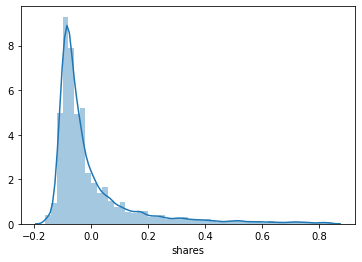

In [ ]:
# Skewed Histogram
sns.distplot(share_df);

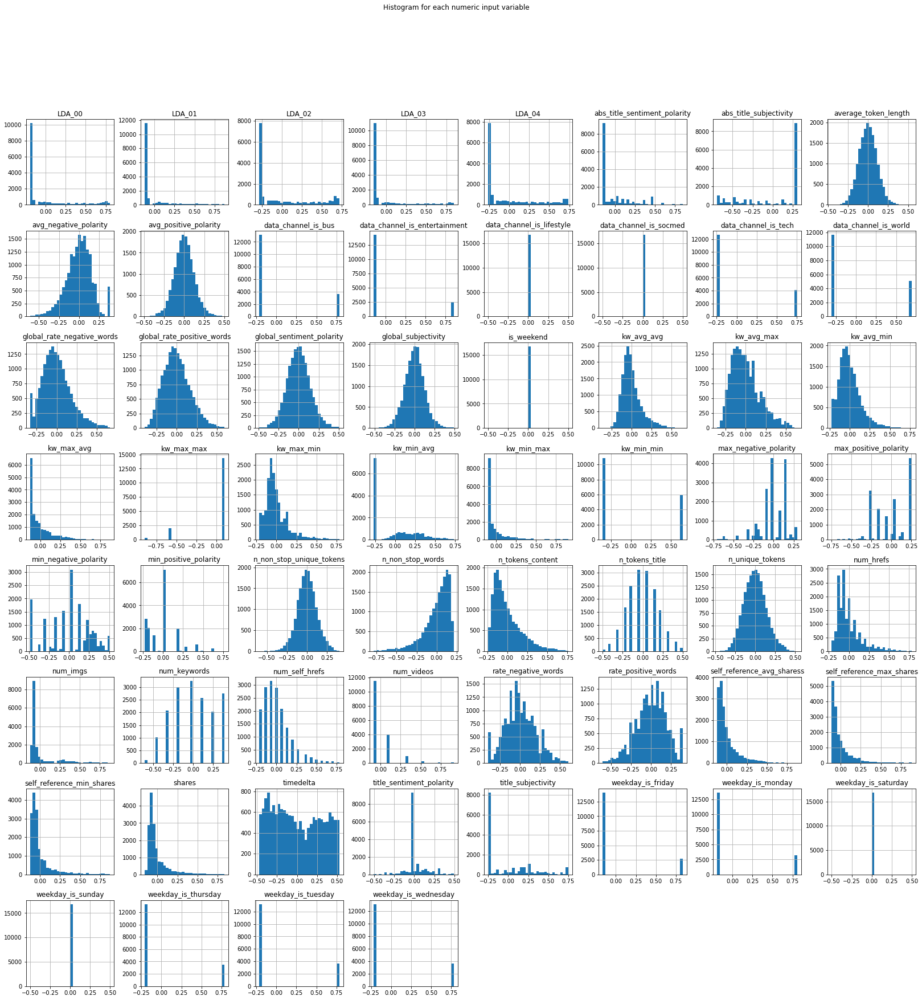

In [ ]:
# Histogram
news.hist(bins = 30, figsize = (28,28))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('news_hist')
plt.show()

### Correlation Matrix

Shows the calculated correlation between all the features pairwise. For better inference correlations are shown in a heatmap style. The closer to red the more correlation exist between two variables. As you can see, the diagonal cells has the most correlation. That's because its between a feature and itself, which is fully correlated(!). You can use this plot to identify those features that are more correlated to eachother and alter in a similar way. Therefore, you can identify features that do not provide additional information for our model and are just acting as a duplicate for the model due to the fact that they have a very close correlation to another feature. Also, if you are trying to predict a variable, you can check the correlation of that with other features. In this case, features with bigger correlations are better. The reason is correlation between target variable and a feature means those two are more coupled to eachother and you can predict with higher confidence by knowing them.

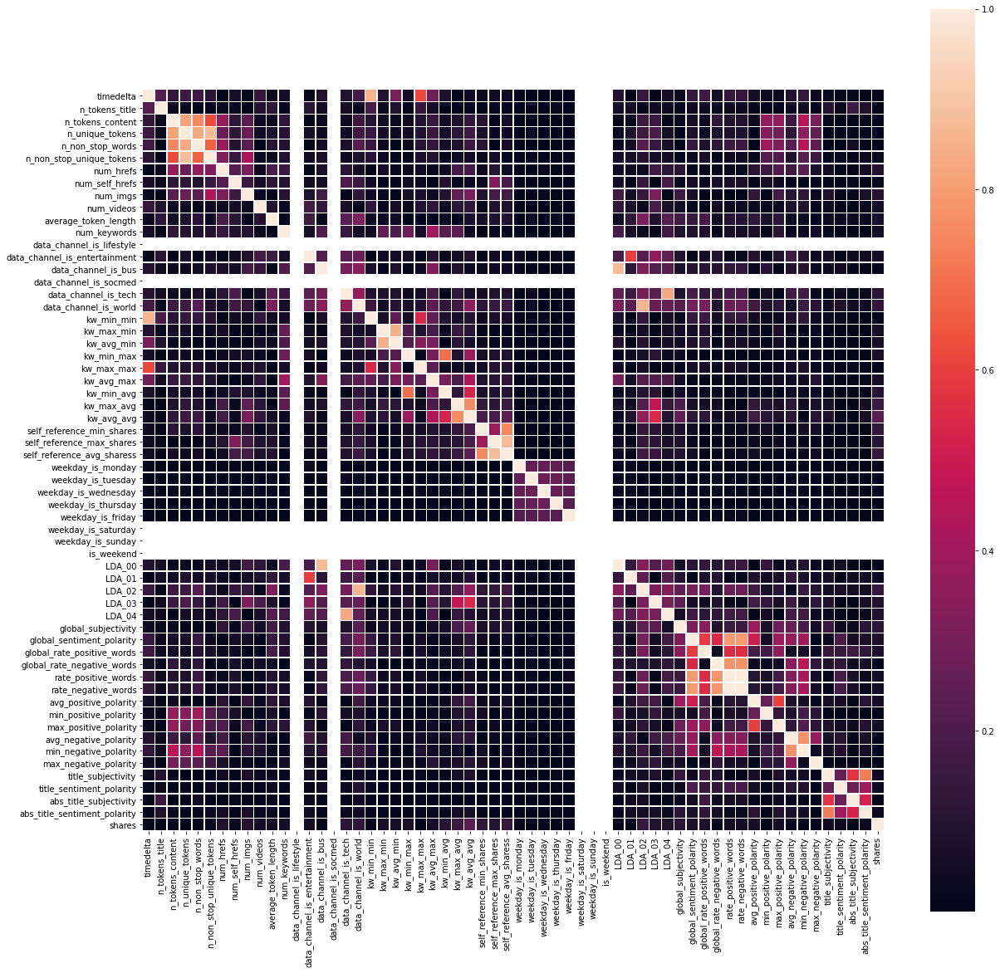

In [ ]:
# Plot a Heatmap
corrmat = np.abs(news.corr())
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, vmax=1,square=True,linewidths=.5)

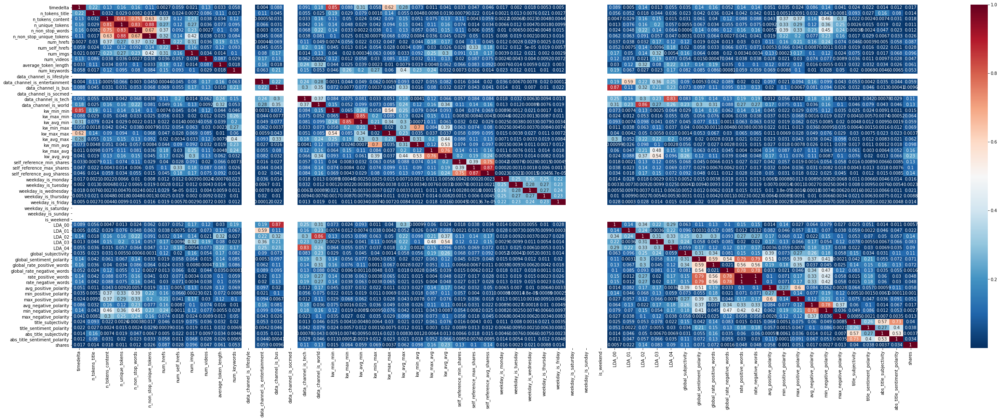

In [ ]:
# Select highly correlated features
#Using Pearson Correlation
plt.figure(figsize=(45,15))
cor = np.abs(news.corr())
sns.heatmap(cor, annot=True, cmap='RdBu_r')
plt.show()

In [ ]:
# Print the correlations for shares and timedelta against all other 
print('Correlation: ')
print(news_df.corr())

Correlation: 
                               timedelta  ...    shares
timedelta                       1.000000  ...  0.016561
n_tokens_title                 -0.219616  ... -0.014015
n_tokens_content               -0.134501  ...  0.017945
n_unique_tokens                 0.157982  ... -0.011180
n_non_stop_words               -0.164833  ... -0.012082
n_non_stop_unique_tokens        0.109625  ... -0.025895
num_hrefs                       0.002708  ...  0.087197
num_self_hrefs                  0.058753  ...  0.028276
num_imgs                       -0.020778  ...  0.095851
num_videos                     -0.134074  ...  0.047279
average_token_length           -0.033130  ... -0.060955
num_keywords                    0.057889  ...  0.053205
data_channel_is_lifestyle            NaN  ...       NaN
data_channel_is_entertainment  -0.003967  ... -0.058536
data_channel_is_bus             0.088144  ... -0.009600
data_channel_is_socmed               NaN  ...       NaN
data_channel_is_tech            0.

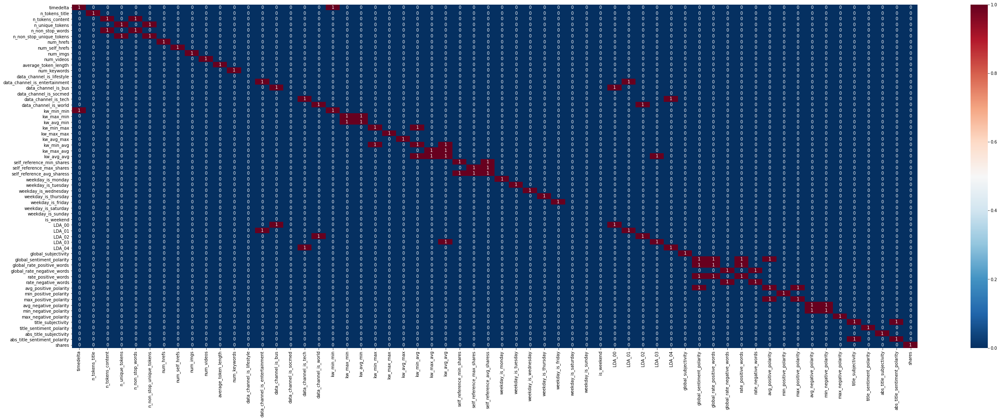

In [ ]:
# Select highly correlated features
# Using Pearson Correlation
plt.figure(figsize=(45,15))
cor = news.corr()>0.5
sns.heatmap(cor, annot=True, cmap='RdBu_r')
plt.show()

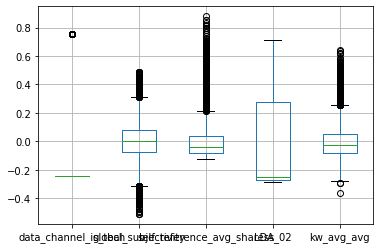

In [ ]:
news.boxplot(column=['data_channel_is_tech', 'global_subjectivity',
       'self_reference_avg_sharess', 'LDA_02', 'kw_avg_avg'])

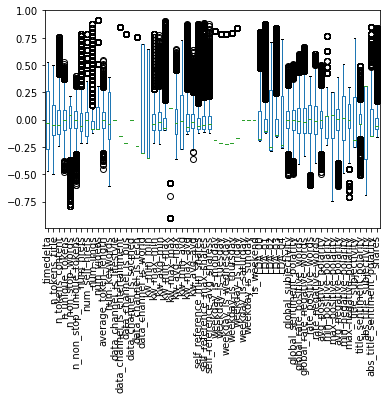

In [ ]:
news.boxplot(grid=False, rot=90, fontsize=10)

## Correlation Threshold Filtering

We select features with more than certain amount of correlation. The top n amounts are used, as well as filtering those that do not meet the thresholds.

In [ ]:
# These are the columns before the filtration
news.columns

Index(['timedelta', 'n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'glob

In [ ]:
news.columns[-1]

'shares'

In [ ]:
share

'shares'

### Top 50

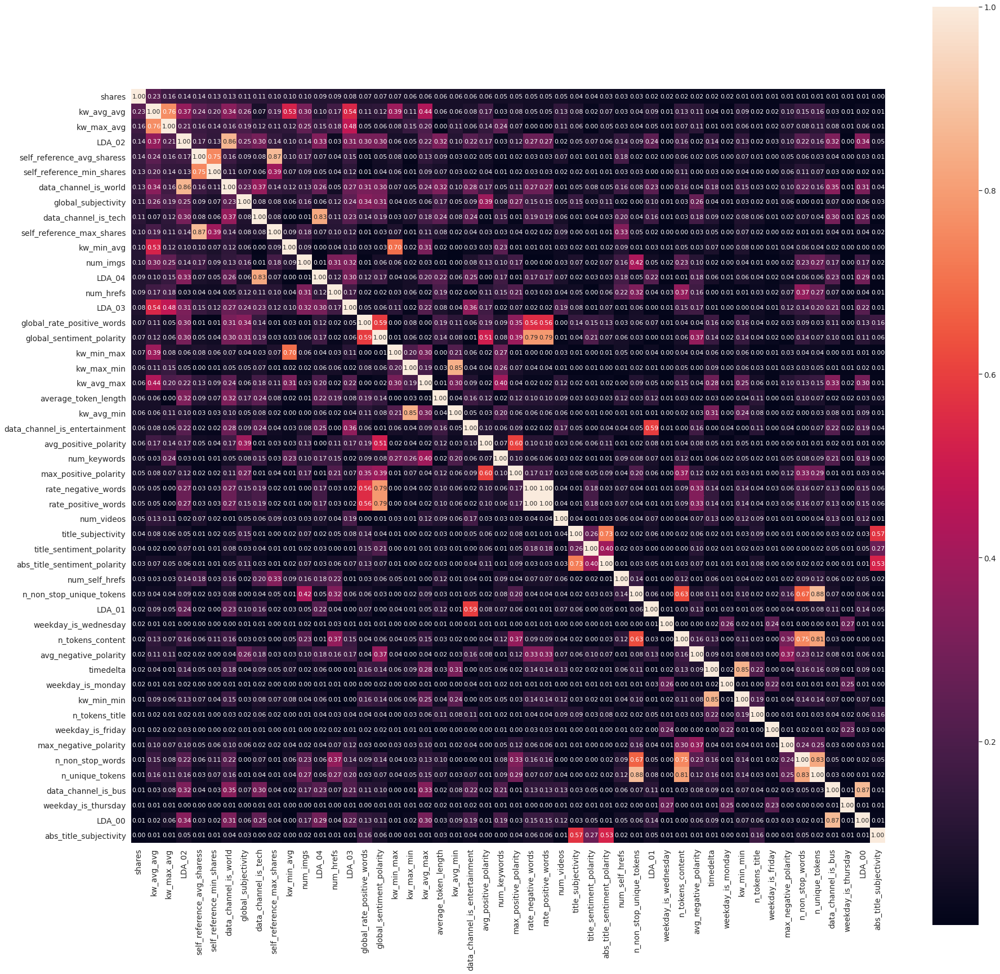

In [ ]:
# Plot the heatmap with all the variables, in correlation with 'target'
corrmat = np.abs(news.corr())
k = 50 #number of variables for heatmap
cols = corrmat.nlargest(k, share)[share].index
cm = np.corrcoef(news[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(30,30))  
hm = sns.heatmap(np.abs(cm), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 11}, yticklabels=cols.values, xticklabels=cols.values, ax=ax)
plt.show() # Save and drop Revenue from dataframe

### Top 10

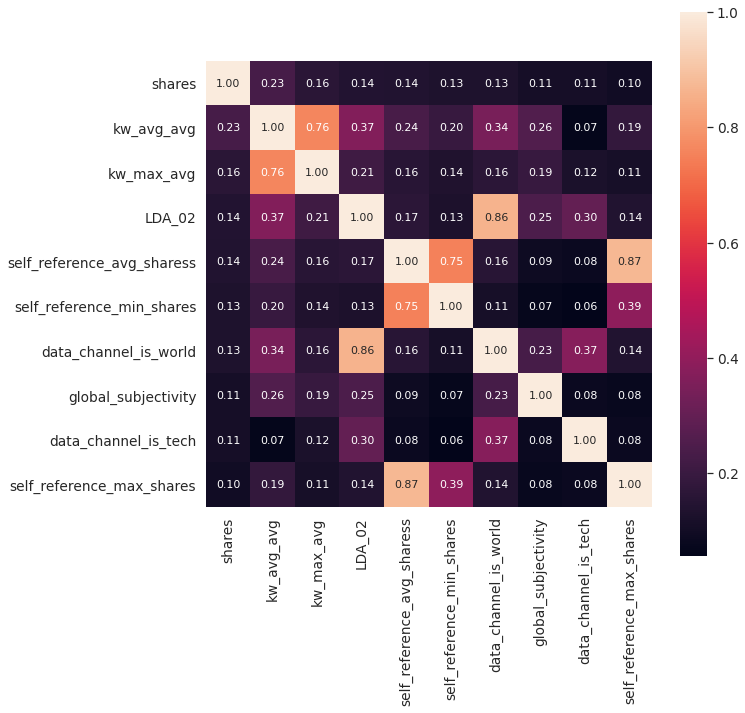

In [ ]:
# Plot the heatmap with all the variables, in correlation with 'target'
corrmat = np.abs(news.corr())
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, share)[share].index
cm = np.corrcoef(news[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(10,10))  
hm = sns.heatmap(np.abs(cm), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 11}, yticklabels=cols.values, xticklabels=cols.values, ax=ax)
plt.show()

### Threshold Filtering

In [ ]:
# Re-define news without outliers
news = news[cols]
news

,shares,kw_avg_avg,kw_max_avg,LDA_02,self_reference_avg_sharess,self_reference_min_shares,data_channel_is_world,global_subjectivity,data_channel_is_tech,self_reference_max_shares
4715,-0.039202,0.150198,0.143639,-0.268182,0.009187,-0.043133,-0.304006,0.083240,-0.243443,0.064509
4717,-0.004047,-0.036499,-0.113901,-0.273458,-0.009130,-0.030633,-0.304006,0.079199,0.756557,0.027563
4718,-0.047991,0.075764,-0.022156,-0.260787,-0.060120,-0.055633,-0.304006,-0.074567,-0.243443,-0.063570
4720,-0.095363,-0.021609,0.029513,0.705160,-0.121506,-0.124383,0.695994,-0.153895,-0.243443,-0.112831
4721,0.075053,-0.025733,-0.113901,-0.268171,-0.044279,-0.011883,-0.304006,-0.248714,0.756557,-0.061107
...,...,...,...,...,...,...,...,...,...,...
39635,-0.047991,0.172641,0.208807,-0.268142,0.163642,0.325617,-0.304006,-0.076391,-0.243443,0.064509
39637,-0.039202,-0.010528,-0.032300,-0.276890,0.083698,-0.070820,-0.304006,-0.003451,-0.243443,0.303425
39638,-0.056780,-0.023090,-0.031206,-0.268167,0.022388,0.000617,-0.304006,0.163434,-0.243443,0.027563
39641,0.004742,0.215585,0.195785,-0.277193,-0.066061,-0.036883,-0.304006,0.101171,-0.243443,-0.078348


In [ ]:
# For target variable correlation:
cor = np.abs(news.corr())
cor = cor[share]

threshold = 0.5 # change the threshold for different results

columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
        if cor.iloc[i] <= 0.05:
            if columns[i]:
                columns[i] = False
# Re-define with high correlation with target variables
selected_columns = news.columns[columns]
news = news[selected_columns]
news

,shares,kw_avg_avg,kw_max_avg,LDA_02,self_reference_avg_sharess,self_reference_min_shares,data_channel_is_world,global_subjectivity,data_channel_is_tech,self_reference_max_shares
4715,-0.039202,0.150198,0.143639,-0.268182,0.009187,-0.043133,-0.304006,0.083240,-0.243443,0.064509
4717,-0.004047,-0.036499,-0.113901,-0.273458,-0.009130,-0.030633,-0.304006,0.079199,0.756557,0.027563
4718,-0.047991,0.075764,-0.022156,-0.260787,-0.060120,-0.055633,-0.304006,-0.074567,-0.243443,-0.063570
4720,-0.095363,-0.021609,0.029513,0.705160,-0.121506,-0.124383,0.695994,-0.153895,-0.243443,-0.112831
4721,0.075053,-0.025733,-0.113901,-0.268171,-0.044279,-0.011883,-0.304006,-0.248714,0.756557,-0.061107
...,...,...,...,...,...,...,...,...,...,...
39635,-0.047991,0.172641,0.208807,-0.268142,0.163642,0.325617,-0.304006,-0.076391,-0.243443,0.064509
39637,-0.039202,-0.010528,-0.032300,-0.276890,0.083698,-0.070820,-0.304006,-0.003451,-0.243443,0.303425
39638,-0.056780,-0.023090,-0.031206,-0.268167,0.022388,0.000617,-0.304006,0.163434,-0.243443,0.027563
39641,0.004742,0.215585,0.195785,-0.277193,-0.066061,-0.036883,-0.304006,0.101171,-0.243443,-0.078348


### Remove Features with High Correlation

In [ ]:
# Remove redundant variables

# There are no redundant features against target variables

# So, we will remove other redundant features

cor = news.corr()

threshold = 0.5 # change the threshold for different results

columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
    for j in range(i+1, cor.shape[0]):
        if cor.iloc[i,j] >= 0.5:
            if columns[j]:
                columns[j] = False

# Re-define with low correlation with pair of features
selected_columns = news.columns[columns]
news = news[selected_columns]
news

,shares,kw_avg_avg,LDA_02,self_reference_avg_sharess,global_subjectivity,data_channel_is_tech
4715,-0.039202,0.150198,-0.268182,0.009187,0.083240,-0.243443
4717,-0.004047,-0.036499,-0.273458,-0.009130,0.079199,0.756557
4718,-0.047991,0.075764,-0.260787,-0.060120,-0.074567,-0.243443
4720,-0.095363,-0.021609,0.705160,-0.121506,-0.153895,-0.243443
4721,0.075053,-0.025733,-0.268171,-0.044279,-0.248714,0.756557
...,...,...,...,...,...,...
39635,-0.047991,0.172641,-0.268142,0.163642,-0.076391,-0.243443
39637,-0.039202,-0.010528,-0.276890,0.083698,-0.003451,-0.243443
39638,-0.056780,-0.023090,-0.268167,0.022388,0.163434,-0.243443
39641,0.004742,0.215585,-0.277193,-0.066061,0.101171,-0.243443


### Swap Target Variable (Only After Correlation)
Correlation causes the target variable to move to the front of the dataframe, so the target variable will be moved back to the end.

In [ ]:
# Define the length of the news columns
n = len(news.columns) - 1

In [ ]:
# Save and drop Revenue from dataframe
swap = news['shares']
news = news.drop(['shares'], axis=1)
# Remove and insert into dataframe
news.insert(n, 'shares', swap)
news

,kw_avg_avg,LDA_02,self_reference_avg_sharess,global_subjectivity,data_channel_is_tech,shares
4715,0.150198,-0.268182,0.009187,0.083240,-0.243443,-0.039202
4717,-0.036499,-0.273458,-0.009130,0.079199,0.756557,-0.004047
4718,0.075764,-0.260787,-0.060120,-0.074567,-0.243443,-0.047991
4720,-0.021609,0.705160,-0.121506,-0.153895,-0.243443,-0.095363
4721,-0.025733,-0.268171,-0.044279,-0.248714,0.756557,0.075053
...,...,...,...,...,...,...
39635,0.172641,-0.268142,0.163642,-0.076391,-0.243443,-0.047991
39637,-0.010528,-0.276890,0.083698,-0.003451,-0.243443,-0.039202
39638,-0.023090,-0.268167,0.022388,0.163434,-0.243443,-0.056780
39641,0.215585,-0.277193,-0.066061,0.101171,-0.243443,0.004742


In [ ]:
# Re-define the variables
news_df = news[news.columns]
share_df = news[news.columns[-1]]
share = news.columns[-1]
share

'shares'

In [ ]:
# Create Training and Test sets and apply scaling
# Scaler: This normalizes the data; reduces impact
# Features that have the greatest value will have 1, while lowest will have 0
news_x = news.drop(share, axis=1)
news_y = share_df
X_train, X_test, y_train, y_test = train_test_split(news_x,news_y, random_state = 0)

## Information Gain
Top Information Gains are selected after splitting the test and training data.

In [ ]:
# IG
feature_ig = mutual_info_regression(X_train, y_train, discrete_features=True)
feature_ig.sort()

# Print IG with features
res = dict(zip(news_x.columns,feature_ig))
res

{'LDA_02': 0.014382280075523335,
 'data_channel_is_tech': 0.25636773804612245,
 'global_subjectivity': 0.06892822376276087,
 'kw_avg_avg': 0.0,
 'self_reference_avg_sharess': 0.04533810147954398}

In [ ]:
# Print top 5,10,15,20
top5 = heapq.nlargest(5, res.keys(), key=lambda k: res[k])
top10 = heapq.nlargest(10, res.keys(), key=lambda k: res[k])
top15 = heapq.nlargest(15, res.keys(), key=lambda k: res[k])
top20 = heapq.nlargest(20, res.keys(), key=lambda k: res[k])

top5

['data_channel_is_tech',
 'global_subjectivity',
 'self_reference_avg_sharess',
 'LDA_02',
 'kw_avg_avg']

In [ ]:
top20

['data_channel_is_tech',
 'global_subjectivity',
 'self_reference_avg_sharess',
 'LDA_02',
 'kw_avg_avg']

In [ ]:
news = news[top20]
news

,data_channel_is_tech,global_subjectivity,self_reference_avg_sharess,LDA_02,kw_avg_avg
4715,-0.243443,0.083240,0.009187,-0.268182,0.150198
4717,0.756557,0.079199,-0.009130,-0.273458,-0.036499
4718,-0.243443,-0.074567,-0.060120,-0.260787,0.075764
4720,-0.243443,-0.153895,-0.121506,0.705160,-0.021609
4721,0.756557,-0.248714,-0.044279,-0.268171,-0.025733
...,...,...,...,...,...
39635,-0.243443,-0.076391,0.163642,-0.268142,0.172641
39637,-0.243443,-0.003451,0.083698,-0.276890,-0.010528
39638,-0.243443,0.163434,0.022388,-0.268167,-0.023090
39641,-0.243443,0.101171,-0.066061,-0.277193,0.215585


In [ ]:
news = news[top5]
news

,data_channel_is_tech,global_subjectivity,self_reference_avg_sharess,LDA_02,kw_avg_avg
4715,-0.243443,0.083240,0.009187,-0.268182,0.150198
4717,0.756557,0.079199,-0.009130,-0.273458,-0.036499
4718,-0.243443,-0.074567,-0.060120,-0.260787,0.075764
4720,-0.243443,-0.153895,-0.121506,0.705160,-0.021609
4721,0.756557,-0.248714,-0.044279,-0.268171,-0.025733
...,...,...,...,...,...
39635,-0.243443,-0.076391,0.163642,-0.268142,0.172641
39637,-0.243443,-0.003451,0.083698,-0.276890,-0.010528
39638,-0.243443,0.163434,0.022388,-0.268167,-0.023090
39641,-0.243443,0.101171,-0.066061,-0.277193,0.215585


## Data Exploration (last)
The last time exploring the data.

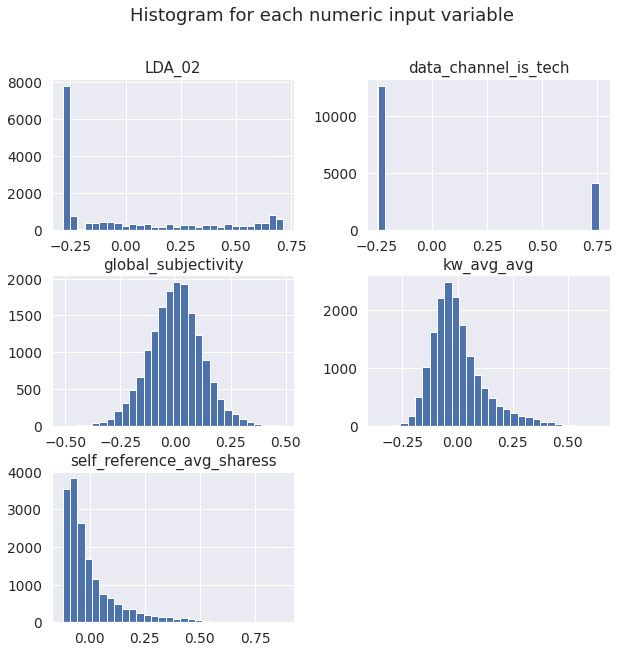

In [ ]:
# Print histograms
news.hist(bins = 30, figsize = (10,10))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('news_hist')
plt.show()

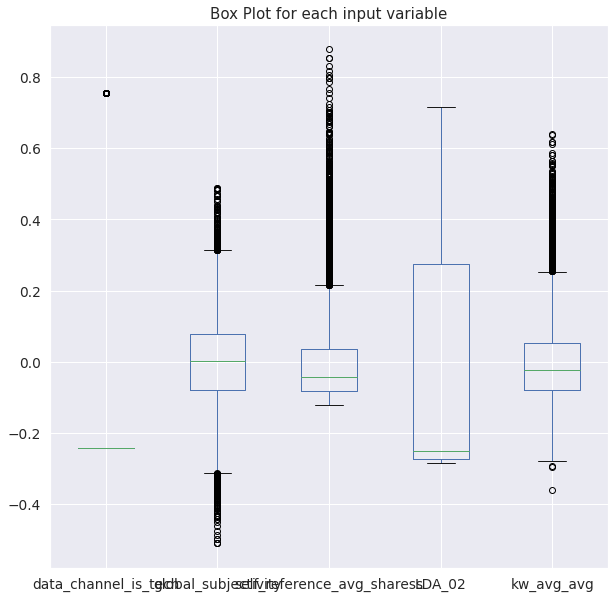

In [ ]:
# Plot boxplots with the resulting variables
news.plot.box(grid='True',figsize = (10,10), title = 'Box Plot for each input variable')

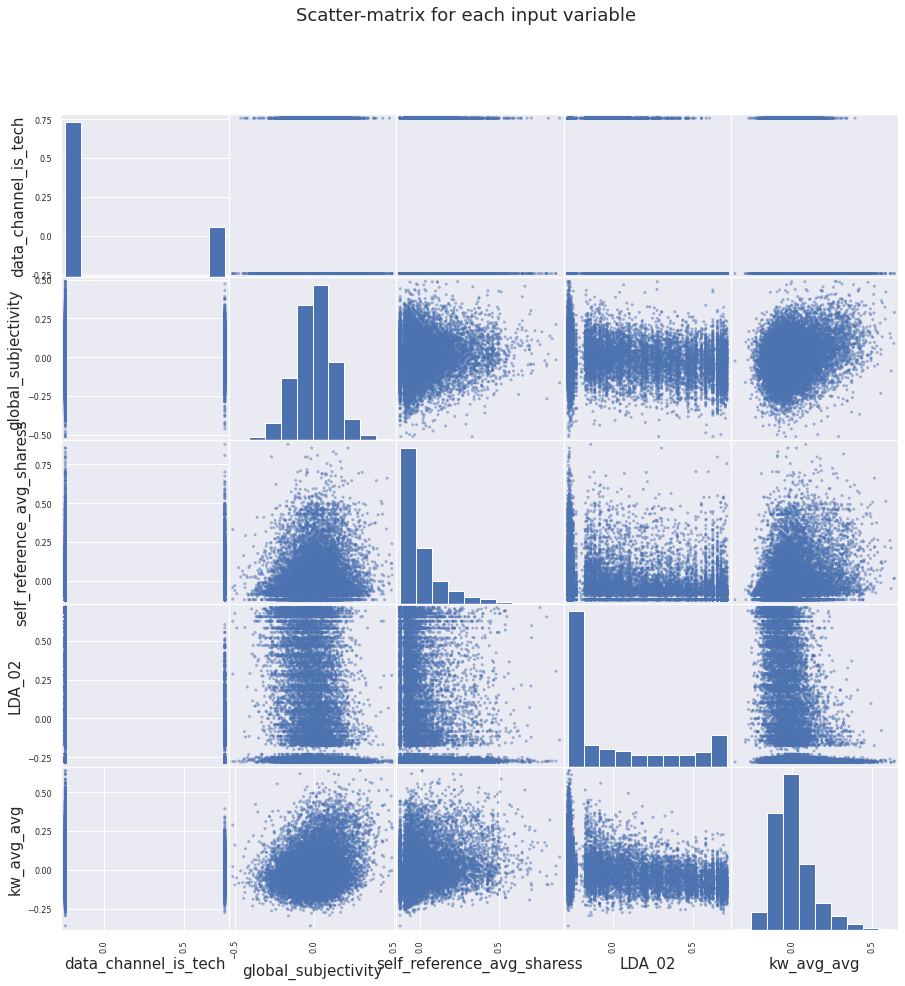

In [ ]:
# Import scatterplot libraries
from pandas.plotting import scatter_matrix
from matplotlib import cm
# Print scatterplots
cmap = cm.get_cmap('gnuplot')
scatter = scatter_matrix(news,alpha=0.5, figsize = (15,15), cmap = cmap)
plt.suptitle('Scatter-matrix for each input variable')
plt.savefig('news_scatter_matrix')

## Model

### Convert to Classification
The target variable will be converted to classification as it will be easier to build the model.
Based on the median, the values lower than the median (closer to 0) will be coverted to 0, while the values grearer than the median (closer to 1) will be converted to 1.

In [ ]:
# Print share_df
share_df

4715    -0.039202
4717    -0.004047
4718    -0.047991
4720    -0.095363
4721     0.075053
           ...   
39635   -0.047991
39637   -0.039202
39638   -0.056780
39641    0.004742
39642   -0.065569
Name: shares, Length: 16776, dtype: float64

In [ ]:
# Convert target value to categorical
median_share = statistics.median(share_df)
news_y = np.where(share_df <= median_share, 0, 1)

news_y

array([1, 1, 1, ..., 0, 1, 0])

In [ ]:
# Print news_y
news_y

array([1, 1, 1, ..., 0, 1, 0])

### Train Model

In [ ]:
# Create Training and Test sets and apply scaling
# Scaler: This normalizes the data; reduces impact
# Now, re-define news_x
X_train, X_test, y_train, y_test = train_test_split(news_x,news_y, random_state = 0)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

news_x

,kw_avg_avg,LDA_02,self_reference_avg_sharess,global_subjectivity,data_channel_is_tech
4715,0.150198,-0.268182,0.009187,0.083240,-0.243443
4717,-0.036499,-0.273458,-0.009130,0.079199,0.756557
4718,0.075764,-0.260787,-0.060120,-0.074567,-0.243443
4720,-0.021609,0.705160,-0.121506,-0.153895,-0.243443
4721,-0.025733,-0.268171,-0.044279,-0.248714,0.756557
...,...,...,...,...,...
39635,0.172641,-0.268142,0.163642,-0.076391,-0.243443
39637,-0.010528,-0.276890,0.083698,-0.003451,-0.243443
39638,-0.023090,-0.268167,0.022388,0.163434,-0.243443
39641,0.215585,-0.277193,-0.066061,0.101171,-0.243443


### Classification

Decision Tree

In [ ]:
# Build models (Decision Tree)
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
print('Accuracy of Decision Tree on training: {:.2f}'
.format(dt.score(X_train, y_train)))
print('Accuracy of Decision Tree on test: {:.2f}'
.format(dt.score(X_test, y_test)))

Accuracy of Decision Tree on training: 1.00
Accuracy of Decision Tree on test: 0.55


K-NN

In [ ]:
#K-nearest Neighbours
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
print('Accuracy of K-NN on training: {:.2f}'
    .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN on test: {:.2f}'
    .format(knn.score(X_test, y_test)))

Accuracy of K-NN on training: 0.73
Accuracy of K-NN on test: 0.58


SVM

In [ ]:
# Support Vector Machine
svm = SVC()
svm.fit(X_train, y_train)
print('Accuracy of SVM on training: {:.2f}'
    .format(svm.score(X_train, y_train)))
print('Accuracy of SVM on test: {:.2f}'
    .format(svm.score(X_test, y_test)))

Accuracy of SVM on training: 0.63
Accuracy of SVM on test: 0.62


Confusion Matrix

In [ ]:
# Confusion matrix for Decision Tree
pred = dt.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[1257  949]
 [ 920 1068]]
              precision    recall  f1-score   support

           0       0.58      0.57      0.57      2206
           1       0.53      0.54      0.53      1988

    accuracy                           0.55      4194
   macro avg       0.55      0.55      0.55      4194
weighted avg       0.55      0.55      0.55      4194



In [ ]:
# Confusion matrix for kNN
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[1359  847]
 [ 905 1083]]
              precision    recall  f1-score   support

           0       0.60      0.62      0.61      2206
           1       0.56      0.54      0.55      1988

    accuracy                           0.58      4194
   macro avg       0.58      0.58      0.58      4194
weighted avg       0.58      0.58      0.58      4194



In [ ]:
# Confusion matrix for SVM
pred = svm.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[1535  671]
 [ 914 1074]]
              precision    recall  f1-score   support

           0       0.63      0.70      0.66      2206
           1       0.62      0.54      0.58      1988

    accuracy                           0.62      4194
   macro avg       0.62      0.62      0.62      4194
weighted avg       0.62      0.62      0.62      4194



### Regression

In [ ]:
'''
# Build models (Decision Tree)
dt = DecisionTreeRegressor()
# fit the model using the training data and training targets
dt.fit(X_train, y_train)
print('Accuracy of Decision Tree on training: {:.2f}'
.format(dt.score(X_train, y_train)))
print('Accuracy of Decision Tree on test: {:.2f}'
.format(dt.score(X_test, y_test)))

#K-nearest Neighbours
# instantiate the model and set the number of neighbors to consider to 3
knn = KNeighborsRegressor(n_neighbors=3)
# fit the model using the training data and training targets
knn.fit(X_train, y_train)
print('Accuracy of K-NN on training: {:.2f}'
    .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN on test: {:.2f}'
    .format(knn.score(X_test, y_test)))

# Support Vector Machine
svm = SVR()
svm.fit(X_train, y_train)
print('Accuracy of SVM on training: {:.2f}'
    .format(svm.score(X_train, y_train)))
print('Accuracy of SVM on test: {:.2f}'
'''

"\n# Build models (Decision Tree)\ndt = DecisionTreeRegressor()\n# fit the model using the training data and training targets\ndt.fit(X_train, y_train)\nprint('Accuracy of Decision Tree on training: {:.2f}'\n.format(dt.score(X_train, y_train)))\nprint('Accuracy of Decision Tree on test: {:.2f}'\n.format(dt.score(X_test, y_test)))\n\n#K-nearest Neighbours\n# instantiate the model and set the number of neighbors to consider to 3\nknn = KNeighborsRegressor(n_neighbors=3)\n# fit the model using the training data and training targets\nknn.fit(X_train, y_train)\nprint('Accuracy of K-NN on training: {:.2f}'\n    .format(knn.score(X_train, y_train)))\nprint('Accuracy of K-NN on test: {:.2f}'\n    .format(knn.score(X_test, y_test)))\n\n# Support Vector Machine\nsvm = SVR()\nsvm.fit(X_train, y_train)\nprint('Accuracy of SVM on training: {:.2f}'\n    .format(svm.score(X_train, y_train)))\nprint('Accuracy of SVM on test: {:.2f}'\n"

Regression Metrics
* Mean Absolute Error
* Mean Square Error
* Root Mean Square Error

In [ ]:
'''
# Decision Tree
pred = dt.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))

# k-NN
pred = knn.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))

# SVM
pred = svm.predict(X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
'''

"\n# Decision Tree\npred = dt.predict(X_test)\nprint('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))\nprint('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))\nprint('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))\n\n# k-NN\npred = knn.predict(X_test)\nprint('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))\nprint('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))\nprint('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))\n\n# SVM\npred = svm.predict(X_test)\nprint('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred))\nprint('Mean Squared Error:', metrics.mean_squared_error(y_test, pred))\nprint('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))\n"

# **Shopping Data**

In [ ]:
# read shopping dataset
shop = pd.read_csv('shop.csv')

In [ ]:
# Define the variables
shop_df = shop[shop.columns]
rev_df = shop[shop.columns[-1]]
rev = shop.columns[-1]

## Data Exploration

### Data Exploration for Target Variable

In [ ]:
# Descriptive statistics summary for all data ## oK?
rev_df.describe()

# This seems that the minimum and max are drastically different, but at least it's above 0

count     12330
unique        2
top       False
freq      10422
Name: Revenue, dtype: object

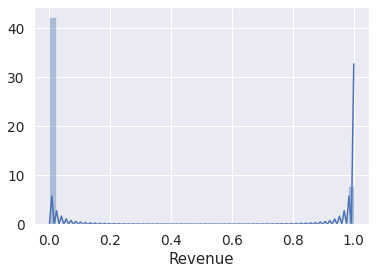

In [ ]:
# Histogram
sns.distplot(rev_df);

In [ ]:
# Skewness and kurtosis
print("Skewness: %f" % rev_df.skew())
print("Kurtosis: %f" % rev_df.kurt())

Skewness: 1.909509
Kurtosis: 1.646493


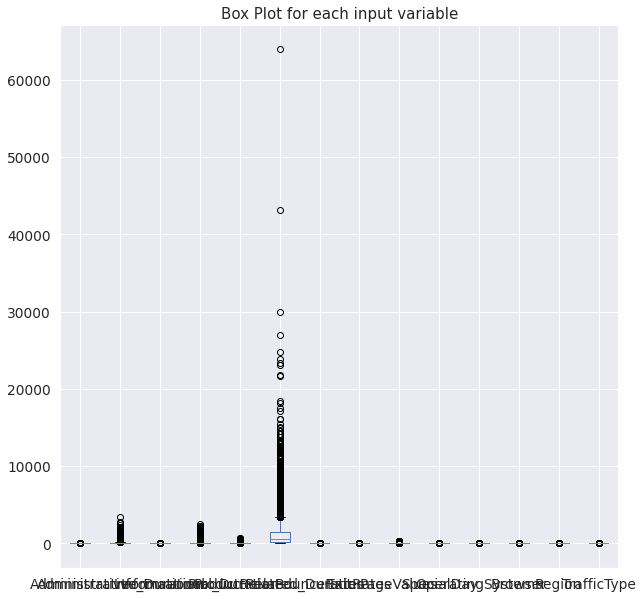

In [ ]:
# Plot boxplot
shop.plot.box(grid='True',figsize = (10,10), title = 'Box Plot for each input variable')

### Data Exploration for Other Features

Heatmap

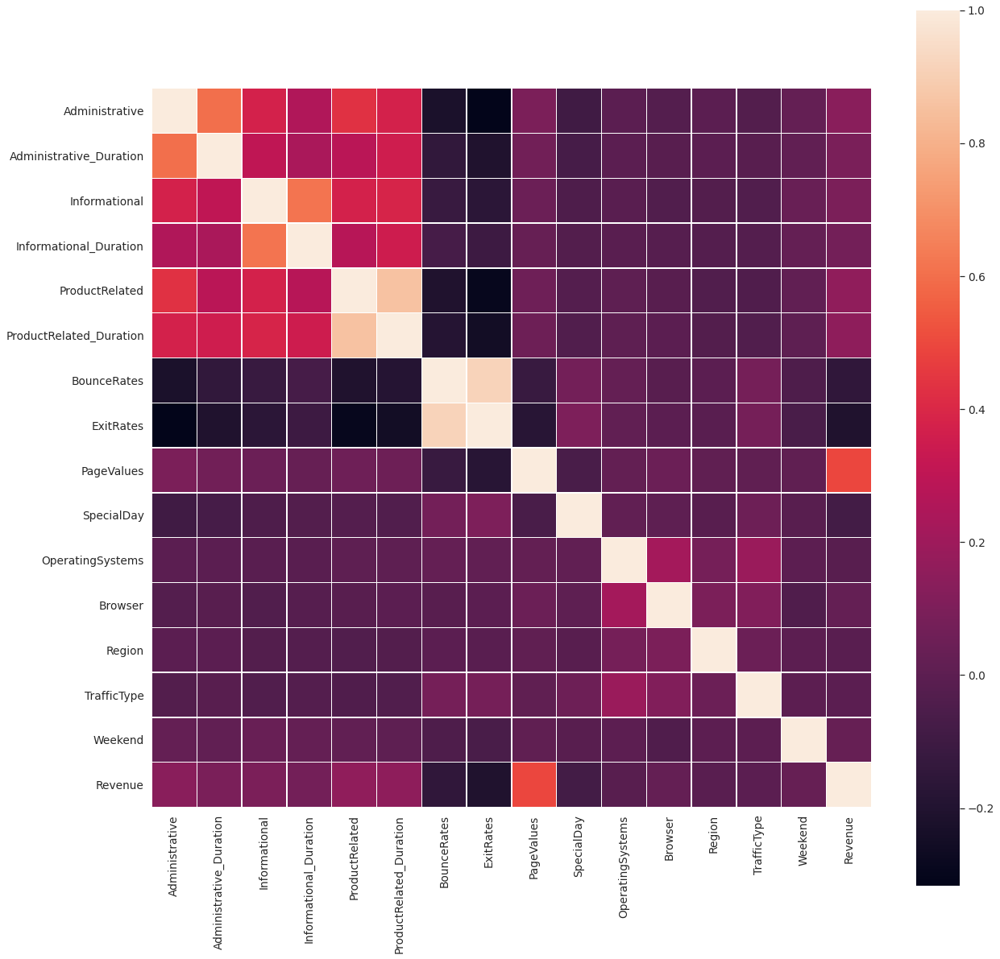

In [ ]:
# Plot a Heatmap
corrmat = shop.corr()
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, vmax=1,square=True,linewidths=.5)

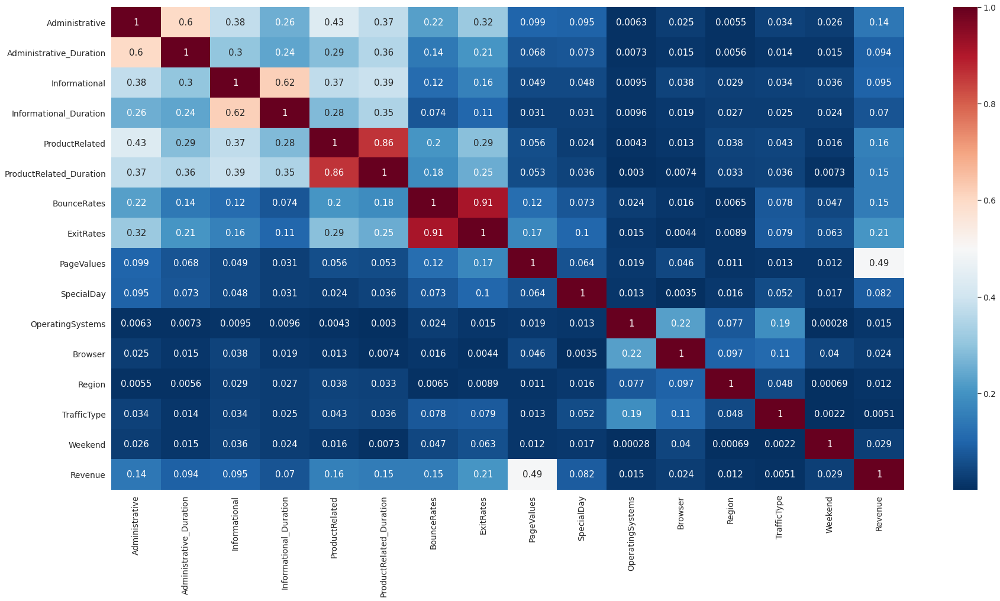

In [ ]:
# Select highly correlated features
# Using Pearson Correlation
plt.figure(figsize=(30,15))
cor = np.abs(shop.corr())
sns.heatmap(cor, annot=True, cmap='RdBu_r')
plt.show()

Text(0.5, 1.0, 'Administrative')

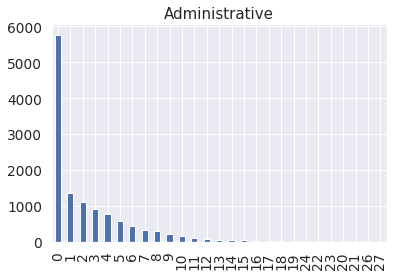

In [ ]:
# Plot histogram
shop[shop.columns[0]].value_counts().plot(kind='bar').set_title(shop.columns[0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6097dd1080>]],
      dtype=object)

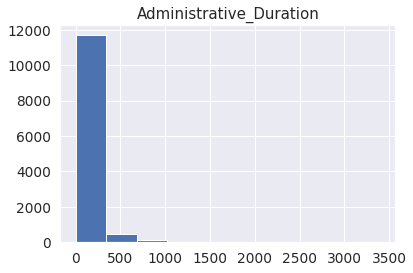

In [ ]:
# Plot histogram
shop.hist(shop.columns[1])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6098b8a470>]],
      dtype=object)

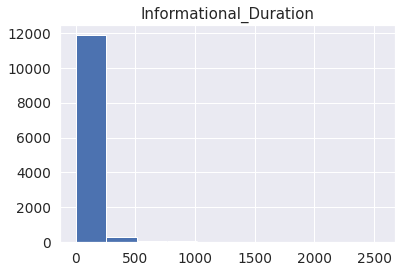

In [ ]:
# Plot histogram
shop.hist(shop.columns[3])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60984fb358>]],
      dtype=object)

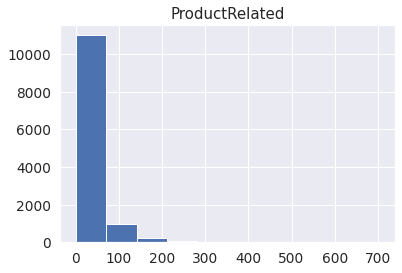

In [ ]:
# Plot histogram
shop.hist(shop.columns[4])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6093254ba8>]],
      dtype=object)

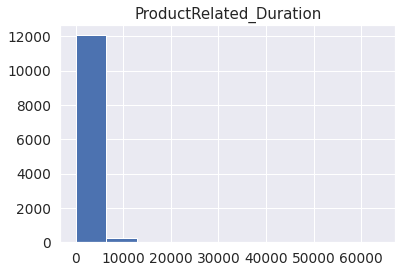

In [ ]:
# Plot histogram
shop.hist(shop.columns[5])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6098f73630>]],
      dtype=object)

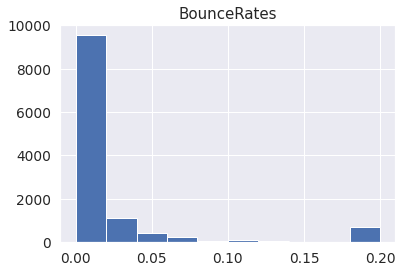

In [ ]:
# Plot histogram
shop.hist(shop.columns[6])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60972135f8>]],
      dtype=object)

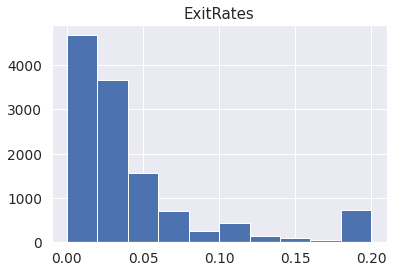

In [ ]:
# Plot histogram
shop.hist(shop.columns[7])

Text(0.5, 1.0, 'Month')

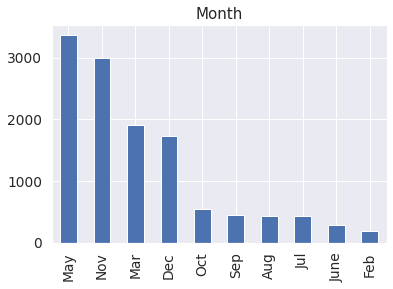

In [ ]:
# Count plot
shop[shop.columns[10]].value_counts().plot(kind='bar').set_title(shop.columns[10])

Text(0.5, 1.0, 'OperatingSystems')

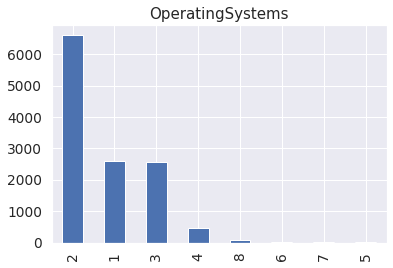

In [ ]:
# Count plot
shop[shop.columns[11]].value_counts().plot(kind='bar').set_title(shop.columns[11])

Text(0.5, 1.0, 'Browser')

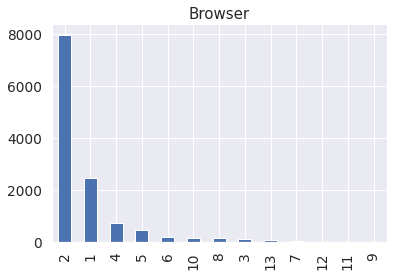

In [ ]:
# Count plot
shop[shop.columns[12]].value_counts().plot(kind='bar').set_title(shop.columns[12])

Text(0.5, 1.0, 'Region')

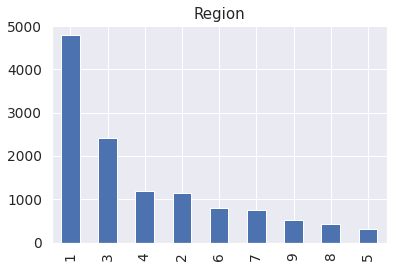

In [ ]:
# Count plot
shop[shop.columns[13]].value_counts().plot(kind='bar').set_title(shop.columns[13])

Text(0.5, 1.0, 'TrafficType')

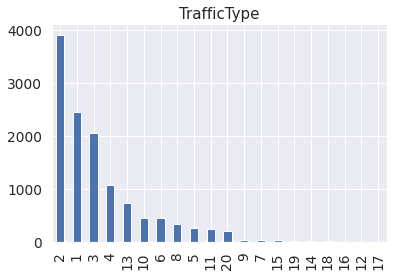

In [ ]:
# Count plot
shop[shop.columns[14]].value_counts().plot(kind='bar').set_title(shop.columns[14])

Text(0.5, 1.0, 'VisitorType')

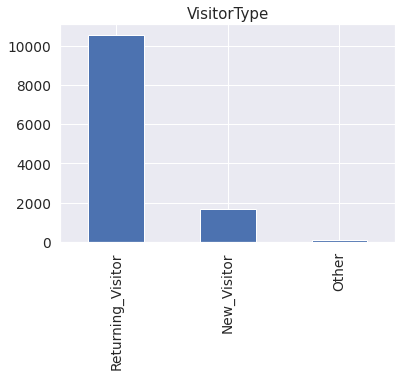

In [ ]:
# Count plot
shop[shop.columns[15]].value_counts().plot(kind='bar').set_title(shop.columns[15])

Text(0.5, 1.0, 'Weekend')

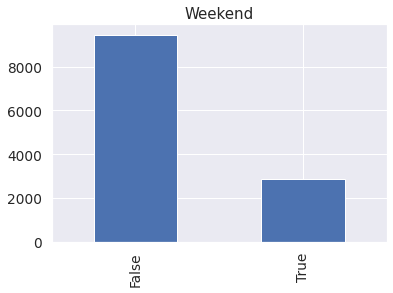

In [ ]:
# Count plot
shop[shop.columns[16]].value_counts().plot(kind='bar').set_title(shop.columns[16])

Text(0.5, 1.0, 'Revenue')

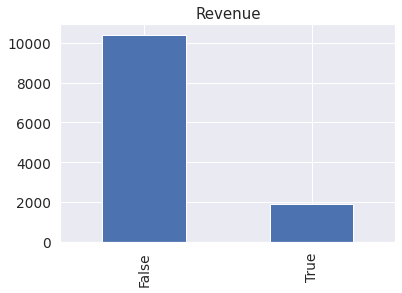

In [ ]:
# Count plot
shop[shop.columns[17]].value_counts().plot(kind='bar').set_title(shop.columns[17])

Correlation Matrix

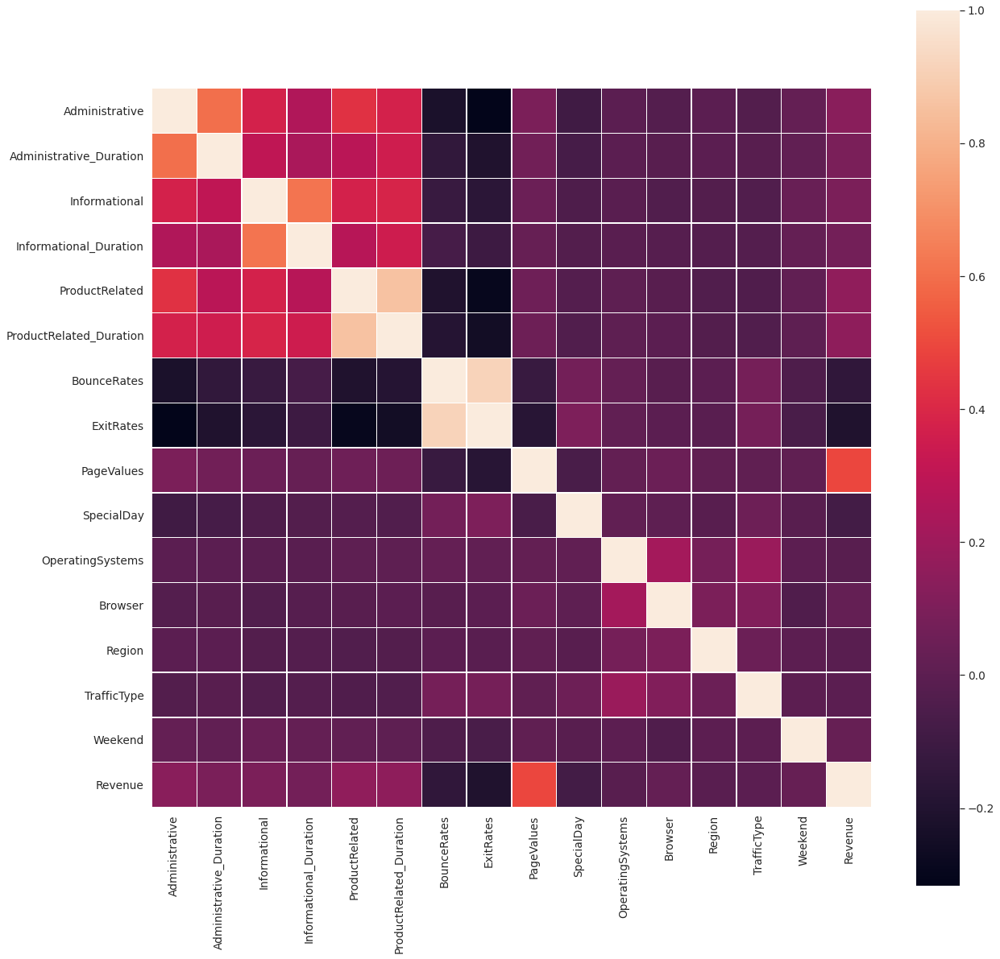

In [ ]:
# Plot a Heatmap
corrmat = shop.corr()
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, vmax=1,square=True,linewidths=.5)

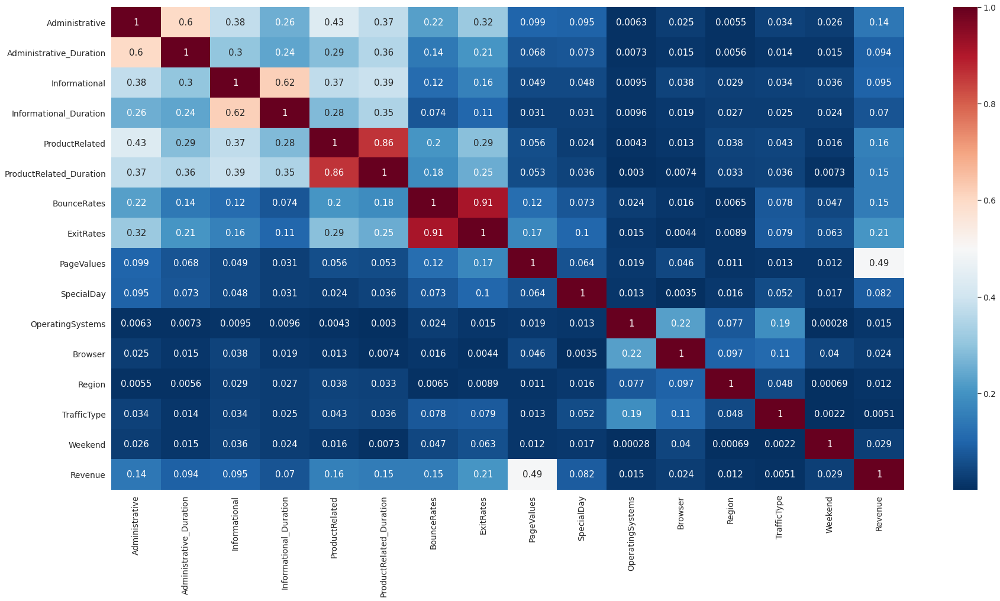

In [ ]:
# Select highly correlated features
#Using Pearson Correlation
plt.figure(figsize=(30,15))
cor = np.abs(shop.corr())
sns.heatmap(cor, annot=True, cmap='RdBu_r')
plt.show()

In [ ]:
shop.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

## One Hot Vector 

Replace True and False values

In [ ]:
shop['Weekend'] = shop['Weekend'].replace({True: 1, False: -1})
shop['Revenue'] = shop['Revenue'].replace({True: 1, False: -1})
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,-1,-1
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,-1,-1
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,-1,-1
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,-1,-1
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,1,-1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,1,-1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,1,-1
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,-1,-1


Adminstrative

In [ ]:
# define example
shop_ad = shop['Administrative']
shop_ad = array(shop_ad)
print(shop_ad)
# one hot encode
ad_encoded = to_categorical(shop_ad)
print(ad_encoded)
shop_ad = ad_encoded
# invert encoding for first value
inverted = argmax(ad_encoded[0])
print(inverted)
# Test
shop_ad

[0 0 0 ... 0 4 0]
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
0


array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'Admin 1', 'Admin 2' , 'Admin 3', 'Admin 4', 'Admin 5', 'Admin 6', 'Admin 7', 'Admin 8', 'Admin 9', 'Admin 10', 'Admin 11', 'Admin 12', 'Admin 13', 'Admin 14', 'Admin 15', 'Admin 16', 'Admin 17', 'Admin 18', 'Admin 19', 'Admin 20', 'Admin 21', 'Admin 22', 'Admin 23', 'Admin 24', 'Admin 25', 'Admin 26', 'Admin 27'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2.0,2.0,3.0,11.0,Returning_Visitor,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for i in range(27):
    shop['Admin {}'.format(i+1)] = shop_ad[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2.0,2.0,3.0,11.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Informational

In [ ]:
# define example
shop_in = shop['Informational']
shop_in = array(shop_in)
print(shop_in)
# one hot encode
in_encoded = to_categorical(shop_in)
print(in_encoded)
shop_in = in_encoded
# invert encoding for first value
inverted = argmax(in_encoded[0])
print(inverted)
# Test
shop_in

[0. 0. 0. ... 0. 0. 0.]
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
0


array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'Informational 1', 'Informational 2' , 'Informational 3', 'Informational 4', 'Informational 5', 'Informational 6', 'Informational 7', 'Informational 8', 'Informational 9', 'Informational 10', 'Informational 11', 'Informational 12', 'Informational 13', 'Informational 14', 'Informational 15', 'Informational 16', 'Informational 17', 'Informational 18', 'Informational 19', 'Informational 20', 'Informational 21', 'Informational 22', 'Informational 23', 'Informational 24'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2.0,2.0,3.0,11.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [ ]:
for i in range(24):
    shop['Informational {}'.format(i+1)] = shop_in[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2.0,2.0,3.0,11.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

Month

In [ ]:
month = shop['Month']
shop_mo = shop['Month']

In [ ]:
# define example
mo_values = array(shop_mo)
print(mo_values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(mo_values)
print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
mo_onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
print(mo_onehot_encoded)
print(len(mo_onehot_encoded[0]))
shop_mo = mo_onehot_encoded
# invert first example
inverted = label_encoder.inverse_transform([argmax(mo_onehot_encoded[0, :])])
print(inverted)
# test new dataframe
shop_mo

['Feb' 'Feb' 'Feb' ... 'Nov' 'Nov' 'Nov']
[2 2 2 ... 7 7 7]
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
10
['Feb']


array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'Month 1', 'Month 2' , 'Month 3', 'Month 4', 'Month 5', 'Month 6', 'Month 7', 'Month 8', 'Month 9', 'Month 10'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,

In [ ]:
shop.head
shop.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue', 'Admin 1', 'Admin 2', 'Admin 3', 'Admin 4',
       'Admin 5', 'Admin 6', 'Admin 7', 'Admin 8', 'Admin 9', 'Admin 10',
       'Admin 11', 'Admin 12', 'Admin 13', 'Admin 14', 'Admin 15', 'Admin 16',
       'Admin 17', 'Admin 18', 'Admin 19', 'Admin 20', 'Admin 21', 'Admin 22',
       'Admin 23', 'Admin 24', 'Admin 25', 'Admin 26', 'Admin 27',
       'Informational 1', 'Informational 2', 'Informational 3',
       'Informational 4', 'Informational 5', 'Informational 6',
       'Informational 7', 'Informational 8', 'Informational 9',
       'Informational 10', 'Informational 11', 'Informational 12',
       'Informational 13', 'Informational 14', 'Informational 15',
     

In [ ]:
for i in range(10):
    shop['Month {}'.format(i+1)] = shop_mo[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,

OperatingSystem

In [ ]:
# define example
shop_os = shop['OperatingSystems']
shop_os = array(shop_os)
print(shop_os)
# one hot encode
os_encoded = to_categorical(shop_os)
print(os_encoded)
shop_os = os_encoded
# invert encoding for first value
inverted = argmax(os_encoded[0])
print(inverted)
# Test
shop_os

[1. 2. 4. ... 3. 2. 3.]
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
1


array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'OperatingSystems 1', 'OperatingSystems 2' , 'OperatingSystems 3', 'OperatingSystems 4', 'OperatingSystems 5', 'OperatingSystems 6', 'OperatingSystems 7', 'OperatingSystems 8'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,

In [ ]:
for i in range(10):
    shop['Month {}'.format(i+1)] = shop_mo[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Informational 3,Informational 4,Informational 5,Informational 6,Informational 7,Informational 8,Informational 9,Informational 10,Informational 11,Informational 12,Informational 13,Informational 14,Informational 15,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,

Browser

In [ ]:
# define example
shop_br = shop['Browser']
shop_br = array(shop_br)
print(shop_br)
# one hot encode
br_encoded = to_categorical(shop_br)
print(br_encoded)
shop_br = br_encoded
# invert encoding for first value
inverted = argmax(br_encoded[0])
print(inverted)
# Test
shop_br

[1. 2. 1. ... 2. 2. 2.]
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
1


array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'Browser 1', 'Browser 2' , 'Browser 3', 'Browser 4', 'Browser 5', 'Browser 6', 'Browser 7', 'Browser 8', 'Browser 9', 'Browser 10', 'Browser 11', 'Browser 12', 'Browser 13'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8,Browser 1,Browser 2,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [ ]:
for i in range(13):
    shop['Browser {}'.format(i+1)] = shop_br[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Informational 16,Informational 17,Informational 18,Informational 19,Informational 20,Informational 21,Informational 22,Informational 23,Informational 24,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8,Browser 1,Browser 2,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

Region

In [ ]:
# define example
shop_rg = shop['Region']
shop_rg = array(shop_rg)
print(shop_rg)
# one hot encode
rg_encoded = to_categorical(shop_rg)
print(rg_encoded)
shop_rg = rg_encoded
# invert encoding for first value
inverted = argmax(rg_encoded[0])
print(inverted)
# Test
shop_rg

[1. 1. 9. ... 1. 3. 1.]
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
1


array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature

shop = pd.concat([shop, pd.DataFrame(columns = [ 'Region 1', 'Region 2' , 'Region 3', 'Region 4', 'Region 5', 'Region 6', 'Region 7', 'Region 8', 'Region 9'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8,Browser 1,Browser 2,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0

In [ ]:
for i in range(9):
    shop['Region {}'.format(i+1)] = shop_rg[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Month 1,Month 2,Month 3,Month 4,Month 5,Month 6,Month 7,Month 8,Month 9,Month 10,OperatingSystems 1,OperatingSystems 2,OperatingSystems 3,OperatingSystems 4,OperatingSystems 5,OperatingSystems 6,OperatingSystems 7,OperatingSystems 8,Browser 1,Browser 2,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0

Traffic Type

In [ ]:
# define example
shop_tt = shop['TrafficType']
shop_tt = array(shop_tt)
print(shop_tt)
# one hot encode
tt_encoded = to_categorical(shop_tt)
print(tt_encoded)
shop_tt = tt_encoded
# invert encoding for first value
inverted = argmax(tt_encoded[0])
print(inverted)
# Test
shop_tt

[ 1.  2.  3. ... 13. 11.  2.]
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
1


array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'TrafficType 1', 'TrafficType 2' , 'TrafficType 3', 'TrafficType 4', 'TrafficType 5', 'TrafficType 6', 'TrafficType 7', 'TrafficType 8', 'TrafficType 9', 'TrafficType 10', 'TrafficType 11', 'TrafficType 12', 'TrafficType 13', 'TrafficType 14', 'TrafficType 15', 'TrafficType 16', 'TrafficType 17', 'TrafficType 18', 'TrafficType 19', 'TrafficType 20'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
for i in range(20):
    shop['TrafficType {}'.format(i+1)] = shop_tt[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 3,Browser 4,Browser 5,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

VisitorType

In [ ]:
shop_vt = shop['VisitorType']

In [ ]:
# define example
vt_values = array(shop_vt)
print(vt_values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(vt_values)
print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
vt_onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
print(vt_onehot_encoded)
shop_vt = vt_onehot_encoded
# invert first example
inverted = label_encoder.inverse_transform([argmax(vt_onehot_encoded[0, :])])
print(inverted)
# test if it changed the dataframe
shop_vt

['Returning_Visitor' 'Returning_Visitor' 'Returning_Visitor' ...
 'Returning_Visitor' 'Returning_Visitor' 'New_Visitor']
[2 2 2 ... 2 2 0]
[[0. 0. 1.]
 [0. 0. 1.]
 [0. 0. 1.]
 ...
 [0. 0. 1.]
 [0. 0. 1.]
 [1. 0. 0.]]
['Returning_Visitor']


array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.]])

In [ ]:
# Change shop feature
shop = pd.concat([shop, pd.DataFrame(columns = [ 'VisitorType 1', 'VisitorType 2' , 'VisitorType 3'])])
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
for i in range(3):
    shop['VisitorType {}'.format(i+1)] = shop_vt[:,i]

shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

## Remove Outliers

In [ ]:
shop_o = shop

In [ ]:
col = shop_o[shop_o.columns[0]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
col = shop_o[shop_o.columns[1]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
col = shop_o[shop_o.columns[2]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
col = shop_o[shop_o.columns[3]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
#shop_o = shop
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6097a6d9b0>]],
      dtype=object)

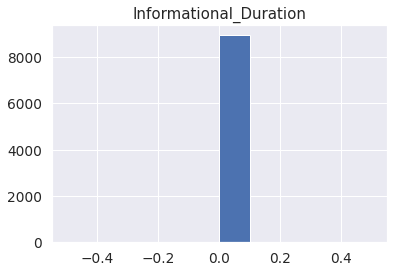

In [ ]:
shop_o.hist(shop_o.columns[3])

In [ ]:
col = shop_o[shop_o.columns[4]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f609706ca58>]],
      dtype=object)

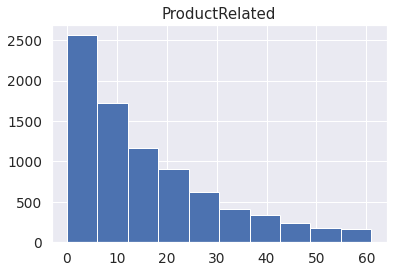

In [ ]:
shop_o.hist(shop_o.columns[4])

In [ ]:
col = shop_o[shop_o.columns[5]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4.0,6.0,1.0,1.0,Returning_Visitor,1.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6096c9f0b8>]],
      dtype=object)

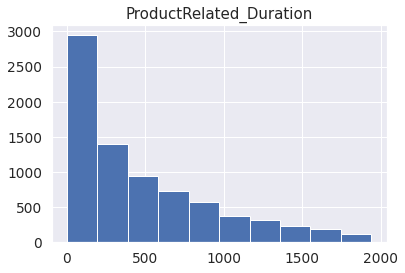

In [ ]:
shop_o.hist(shop_o.columns[5])

In [ ]:
col = shop_o[shop_o.columns[5]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
0,0.0,0.00,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.0,0.0,Feb,1.0,1.0,1.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.00,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.0,0.0,Feb,4.0,1.0,9.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.00,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.0,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12327,0.0,0.00,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.0,0.0,Nov,3.0,2.0,1.0,13.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f60961883c8>]],
      dtype=object)

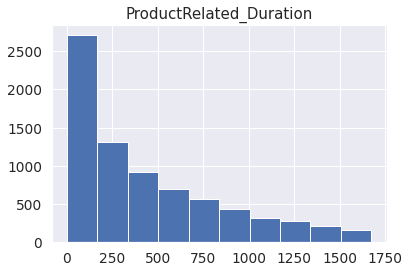

In [ ]:
shop_o.hist(shop_o.columns[5])

In [ ]:
col = shop_o[shop_o.columns[6]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.00,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.0,0.0,Feb,3.0,2.0,2.0,4.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.0,0.00,0.0,0.0,2.0,37.000000,0.000000,0.100000,0.0,0.8,Feb,2.0,2.0,2.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f609698b710>]],
      dtype=object)

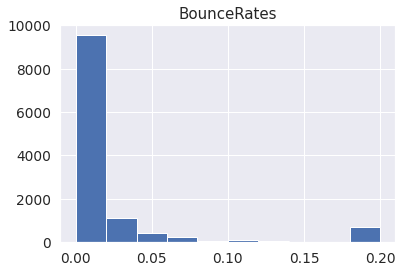

In [ ]:
shop.hist(shop.columns[6])

In [ ]:
col = shop_o[shop_o.columns[7]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.0,0.00,0.0,0.0,2.0,37.000000,0.000000,0.100000,0.0,0.8,Feb,2.0,2.0,2.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.0,0.00,0.0,0.0,3.0,738.000000,0.000000,0.022222,0.0,0.4,Feb,2.0,4.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f609757aa58>]],
      dtype=object)

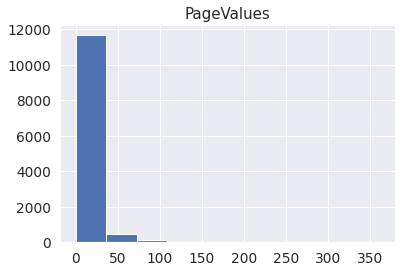

In [ ]:
shop.hist(shop.columns[8])

In [ ]:
col = shop_o[shop_o.columns[8]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.0,0.00,0.0,0.0,2.0,37.000000,0.000000,0.100000,0.0,0.8,Feb,2.0,2.0,2.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.0,0.00,0.0,0.0,3.0,738.000000,0.000000,0.022222,0.0,0.4,Feb,2.0,4.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.

In [ ]:
col = shop_o[shop_o.columns[9]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
10,0.0,0.00,0.0,0.0,3.0,395.000000,0.000000,0.066667,0.0,0.0,Feb,1.0,1.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12,0.0,0.00,0.0,0.0,7.0,280.500000,0.000000,0.028571,0.0,0.0,Feb,1.0,1.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0

In [ ]:
col = shop_o[shop_o.columns[11]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.00,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3.0,3.0,1.0,4.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
10,0.0,0.00,0.0,0.0,3.0,395.000000,0.000000,0.066667,0.0,0.0,Feb,1.0,1.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12,0.0,0.00,0.0,0.0,7.0,280.500000,0.000000,0.028571,0.0,0.0,Feb,1.0,1.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0

In [ ]:
col = shop_o[shop_o.columns[12]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.0,0.00,0.0,0.0,2.0,68.000000,0.000000,0.100000,0.0,0.0,Feb,3.0,2.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.0,0.00,0.0,0.0,2.0,32.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.0,0.00,0.0,0.0,3.0,105.000000,0.000000,0.033333,0.0,0.0,Feb,3.0,2.0,1.0,5.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,

In [ ]:
col = shop_o[shop_o.columns[13]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.0,0.00,0.0,0.0,2.0,68.000000,0.000000,0.100000,0.0,0.0,Feb,3.0,2.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.0,0.00,0.0,0.0,2.0,32.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.0,0.00,0.0,0.0,3.0,105.000000,0.000000,0.033333,0.0,0.0,Feb,3.0,2.0,1.0,5.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12323,2.0,64.75,0.0,0.0,44.0,1157.976190,0.000000,0.013953,0.0,0.0,Nov,2.0,2.0,1.0,10.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12326,0.0,0.00,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,0.0,Nov,3.0,2.0,1.0,8.0,Returning_Visitor,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,

In [ ]:
col = shop_o[shop_o.columns[14]]

Q1 = col.quantile(0.25)
Q3 = col.quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (col >= Q1 - 1.5 * IQR) & (col <= Q3 + 1.5 *IQR)
shop_o = shop_o.loc[filter]
shop_o

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.0,0.00,0.0,0.0,2.0,68.000000,0.000000,0.100000,0.0,0.0,Feb,3.0,2.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.0,0.00,0.0,0.0,2.0,32.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.0,0.00,0.0,0.0,3.0,105.000000,0.000000,0.033333,0.0,0.0,Feb,3.0,2.0,1.0,5.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,1.0,5.00,0.0,0.0,21.0,411.083333,0.015789,0.016140,0.0,0.0,Nov,3.0,2.0,7.0,3.0,Returning_Visitor,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12320,0.0,0.00,0.0,0.0,8.0,143.583333,0.014286,0.050000,0.0,0.0,Nov,2.0,2.0,3.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.

In [ ]:
shop = shop_o
shop

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.0,0.00,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,2.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,0.00,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.0,0.00,0.0,0.0,2.0,68.000000,0.000000,0.100000,0.0,0.0,Feb,3.0,2.0,3.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.0,0.00,0.0,0.0,2.0,32.000000,0.000000,0.100000,0.0,0.0,Feb,2.0,2.0,1.0,3.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.0,0.00,0.0,0.0,3.0,105.000000,0.000000,0.033333,0.0,0.0,Feb,3.0,2.0,1.0,5.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,1.0,5.00,0.0,0.0,21.0,411.083333,0.015789,0.016140,0.0,0.0,Nov,3.0,2.0,7.0,3.0,Returning_Visitor,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12320,0.0,0.00,0.0,0.0,8.0,143.583333,0.014286,0.050000,0.0,0.0,Nov,2.0,2.0,3.0,1.0,Returning_Visitor,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12322,6.0,76.25,0.0,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,Dec,2.0,2.0,4.0,2.0,Returning_Visitor,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.

## Drop Columns

In [ ]:
shop = shop.drop(['Administrative', 'Informational', 'Month', 'OperatingSystems','Browser','Region','TrafficType','VisitorType'], axis=1)
shop

,Administrative_Duration,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.00,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.00,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.00,0.0,2.0,68.000000,0.000000,0.100000,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.00,0.0,2.0,32.000000,0.000000,0.100000,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.00,0.0,3.0,105.000000,0.000000,0.033333,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,5.00,0.0,21.0,411.083333,0.015789,0.016140,0.0,0.0,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12320,0.00,0.0,8.0,143.583333,0.014286,0.050000,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12322,76.25,0.0,22.0,1075.250000,0.000000,0.004167,0.0,0.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

## Normalization

In [ ]:
def normalize(df):
    result = df.copy()
    for i in range(8):
        max_value = df[df.columns[i]].max()
        min_value = df[df.columns[i]].min()
        result[result.columns[i]] = (df[df.columns[i]] - min_value) / (max_value - min_value)
    return result
shop = normalize(shop) # but you can't normalize categorical data
shop = shop.fillna(0)
shop

,Administrative_Duration,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Revenue,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,...,Browser 6,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3
1,0.000000,0.0,0.032787,0.038232,0.000000,0.985714,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.000000,0.0,0.311475,0.092125,0.236842,0.242105,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,0.000000,0.0,0.032787,0.040621,0.000000,0.985714,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.000000,0.0,0.032787,0.019116,0.000000,0.985714,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
22,0.000000,0.0,0.049180,0.062724,0.000000,0.328571,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,0.024752,0.0,0.344262,0.245569,0.236842,0.159098,0.0,0.0,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12320,0.000000,0.0,0.131148,0.085773,0.214286,0.492857,0.0,0.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12322,0.377475,0.0,0.360656,0.642324,0.000000,0.041071,0.0,0.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.

In [ ]:
# Save and drop Revenue from dataframe
swap = shop['Revenue']
shop = shop.drop(['Revenue'], axis=1)
# Remove and insert into dataframe
shop.insert(123, 'Revenue', swap)
shop

,Administrative_Duration,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,...,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3,Revenue
1,0.000000,0.0,0.032787,0.038232,0.000000,0.985714,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
5,0.000000,0.0,0.311475,0.092125,0.236842,0.242105,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
14,0.000000,0.0,0.032787,0.040621,0.000000,0.985714,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
18,0.000000,0.0,0.032787,0.019116,0.000000,0.985714,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
22,0.000000,0.0,0.049180,0.062724,0.000000,0.328571,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,0.024752,0.0,0.344262,0.245569,0.236842,0.159098,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
12320,0.000000,0.0,0.131148,0.085773,0.214286,0.492857,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
12322,0.377475,0.0,0.360656,0.642324,0.000000,0.041071,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0

### Data Exploration (again)

In [ ]:
# Show the dataframe
shop.describe()

,Administrative_Duration,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Admin 1,Admin 2,Admin 3,Admin 4,Admin 5,Admin 6,Admin 7,Admin 8,Admin 9,Admin 10,Admin 11,Admin 12,Admin 13,Admin 14,Admin 15,Admin 16,Admin 17,Admin 18,Admin 19,Admin 20,Admin 21,Admin 22,Admin 23,Admin 24,Admin 25,Admin 26,Admin 27,Informational 1,Informational 2,Informational 3,Informational 4,...,Browser 7,Browser 8,Browser 9,Browser 10,Browser 11,Browser 12,Browser 13,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,TrafficType 1,TrafficType 2,TrafficType 3,TrafficType 4,TrafficType 5,TrafficType 6,TrafficType 7,TrafficType 8,TrafficType 9,TrafficType 10,TrafficType 11,TrafficType 12,TrafficType 13,TrafficType 14,TrafficType 15,TrafficType 16,TrafficType 17,TrafficType 18,TrafficType 19,TrafficType 20,VisitorType 1,VisitorType 2,VisitorType 3,Revenue
count,2543.000000,2543.0,2543.000000,2543.000000,2543.000000,2543.000000,2543.0,2543.0,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,...,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.0,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.000000,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.0,2543.000000,2543.000000,2543.000000,2543.000000
mean,0.139397,0.0,0.255133,0.281275,0.121622,0.339086,0.0,0.0,-0.535195,0.567440,0.115218,0.104601,0.082580,0.053480,0.029099,0.020055,0.016516,0.006685,0.001966,0.002359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.372788,0.094770,0.180889,0.092804,0.028706,0.076288,0.072355,0.039324,0.0,0.256783,0.359811,0.181282,0.089658,0.022808,0.046795,0.003539,0.035785,0.003539,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.203303,0.002359,0.794337,-0.931577
std,0.225350,0.0,0.199796,0.246321,0.209911,0.249652,0.0,0.0,0.844895,0.495529,0.319348,0.306098,0.275302,0.225034,0.168119,0.140214,0.127475,0.081505,0.044306,0.048527,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.483645,0.292959,0.384997,0.290210,0.167012,0.265509,0.259124,0.194404,0.0,0.436948,0.480040,0.385329,0.285750,0.149317,0.211241,0.059396,0.185789,0.059396,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.402535,0.048526,0.404264,0.363616
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,-1.000000
25%,0.000000,0.0,0.098361,0.083508,0.000000,0.148547,0.0,0.0,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,-1.000000
50%,0.000000,0.0,0.196721,0.204851,0.000000,0.276692,0.0,0.0,-1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [ ]:
# Re-define the variables
shop_df = shop[shop.columns]
rev_df = shop[shop.columns[-1]]
rev = shop.columns[-1]

## Data Exploration

Here is the final list of features that probabely are more informative for us and are recommended to be used for further processes. 

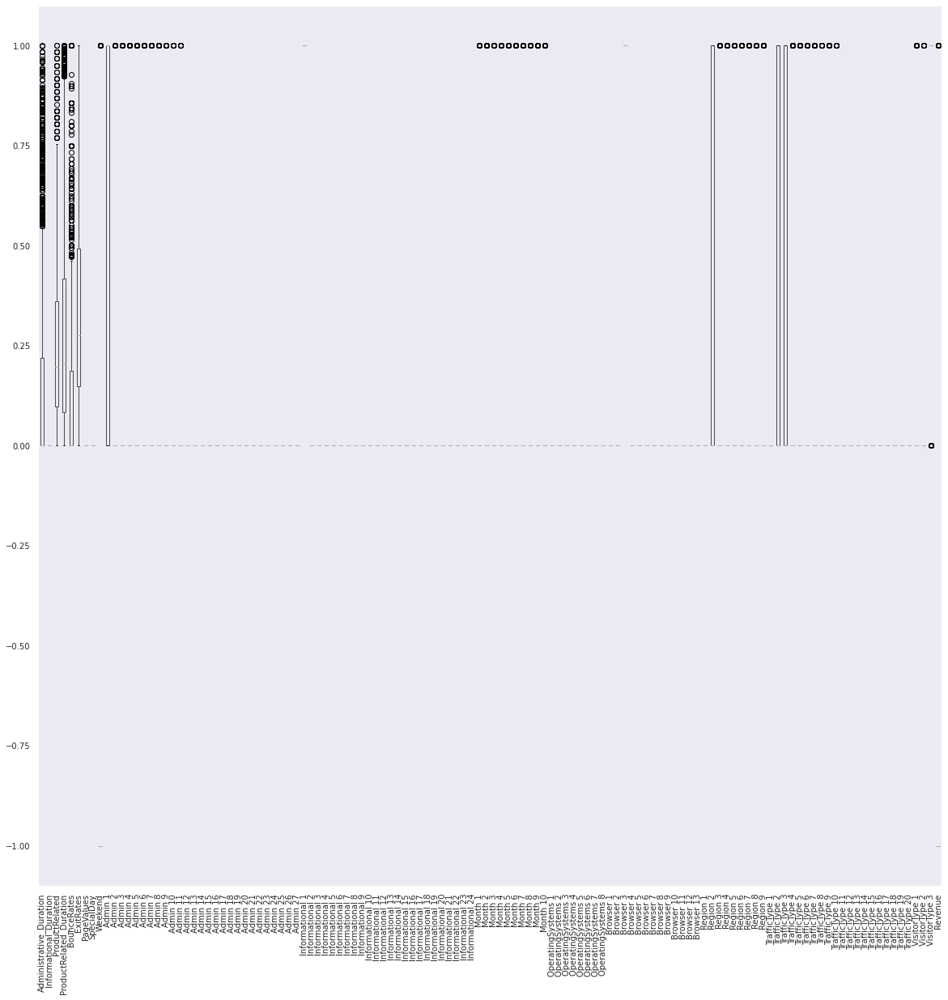

In [ ]:
# Print boxplots after normalization and remove outliers
shop.boxplot(grid=False, figsize=(20,20), rot=90, fontsize=10)

# This is difficult to see

In [ ]:
# Calculate the length of the shop's columns
num = len(shop.columns)
shop.columns[0]

'Administrative_Duration'

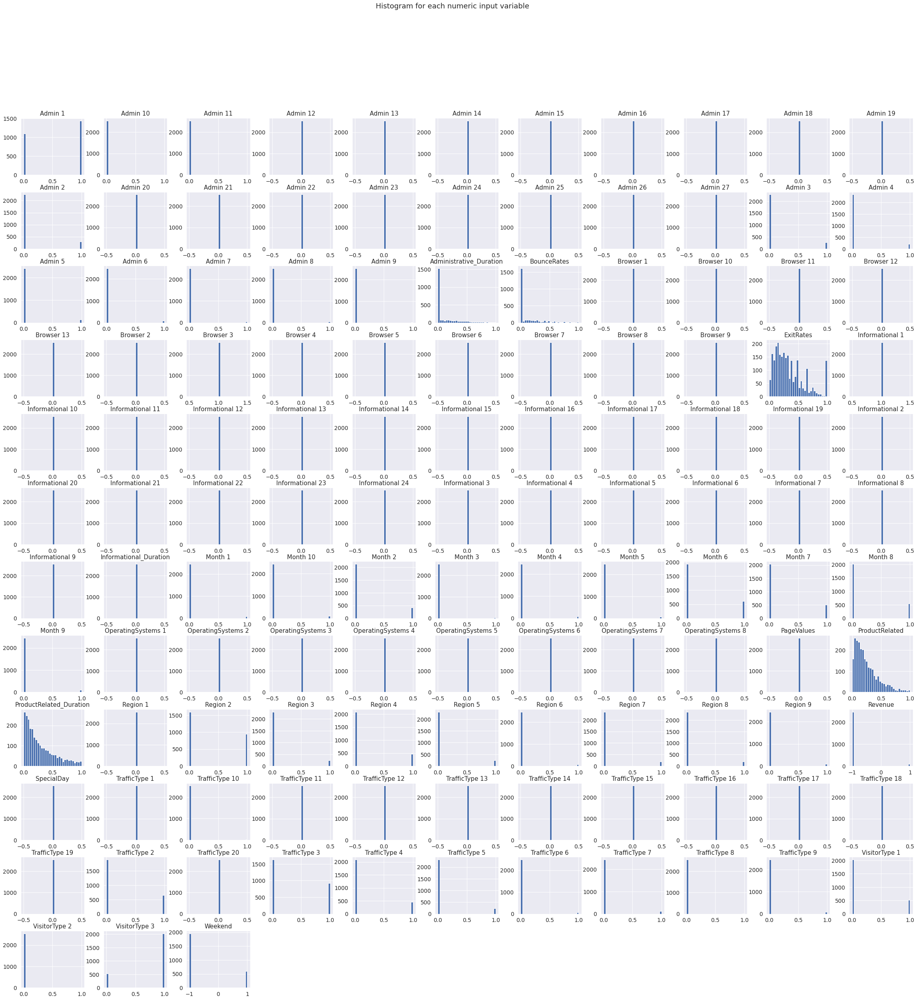

In [ ]:
# Print Histogram
shop.hist(bins = 30, figsize = (40,40))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('shop_hist')
plt.show()

Correlation Matrix

we difined a function that gets a dataframe as the input and show the calculated correlation between all the features pairwise. For better inference correlations are shown in a heatmap style.

The closer to red the more correlation exist between two variables. As you can see, the diagonal cells has the most correlation. That's because its between a feature and itself, which is fully correlated(!). You can use this plot to identify those features that are more correlated to eachother and alter in a similar way. Therefore, you can identify features that do not provide additional information for our model and are just acting as a duplicate for the model due to the fact that they have a very close correlation to another feature. Also, if you are trying to predict a variable, you can check the correlation of that with other features. In this case, features with bigger correlations are better. The reason is correlation between target variable and a feature means those two are more coupled to eachother and you can predict with higher confidence by knowing them.

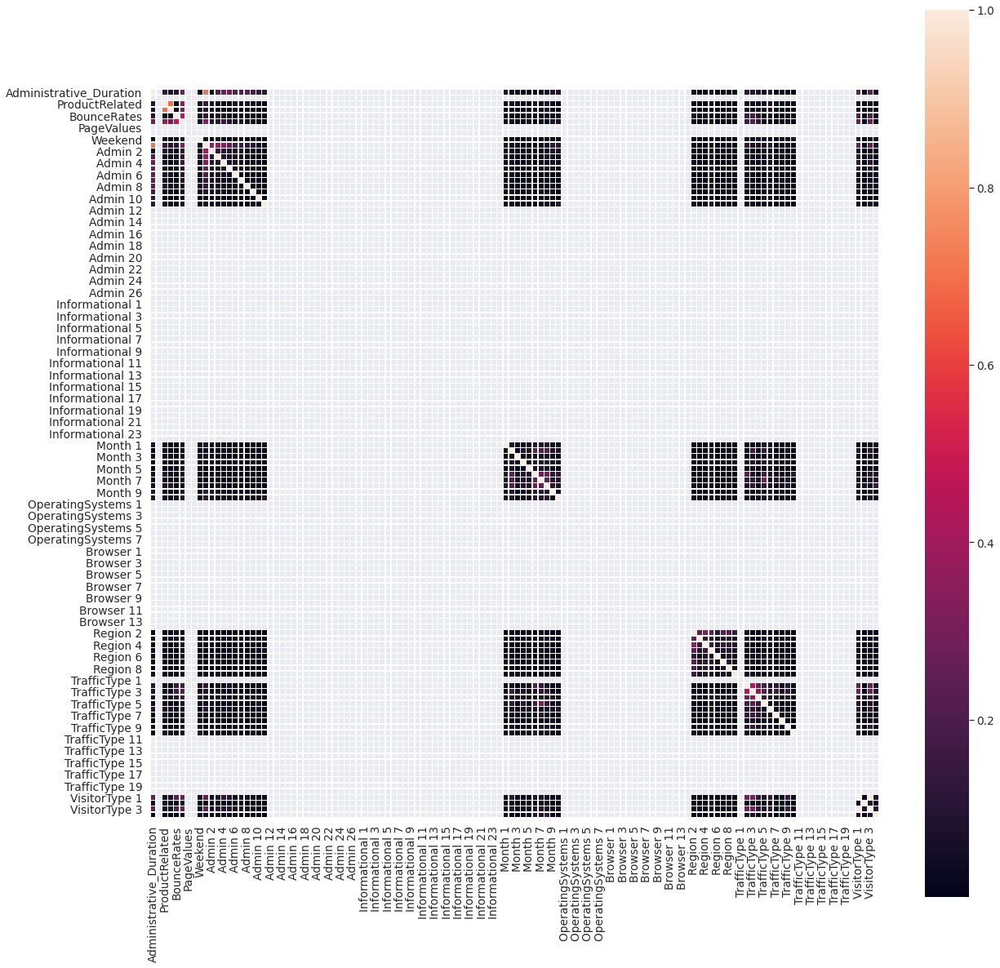

In [ ]:
# Plot a Heatmap
corrmat = np.abs(shop.corr())
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, vmax=1,square=True,linewidths=.5)

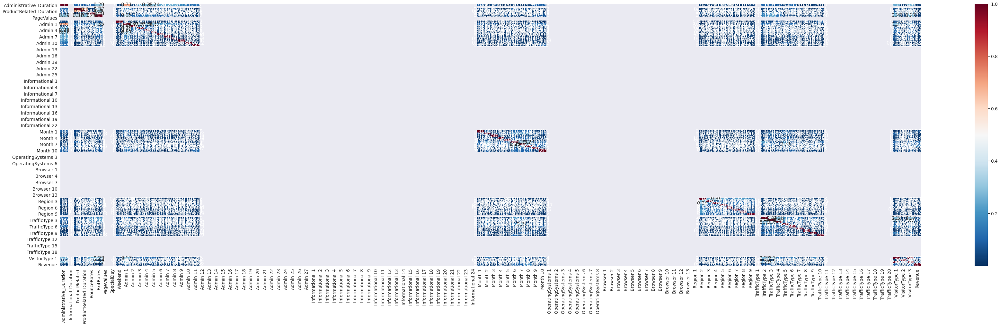

In [ ]:
# Select highly correlated features
#Using Pearson Correlation
plt.figure(figsize=(60,15))
cor = np.abs(shop.corr())
sns.heatmap(cor, annot=True, cmap='RdBu_r')
plt.show()

# This is too difficult to see, but we can see most of the variables not correlated with thhe target or other variables

In [ ]:
# Print the correlations 
print('Correlation: ')
print(shop_df.corr())

Correlation: 
                         Administrative_Duration  ...   Revenue
Administrative_Duration                 1.000000  ...  0.029830
Informational_Duration                       NaN  ...       NaN
ProductRelated                          0.108565  ... -0.010828
ProductRelated_Duration                 0.082373  ... -0.006415
BounceRates                            -0.104840  ... -0.012288
...                                          ...  ...       ...
TrafficType 20                               NaN  ...       NaN
VisitorType 1                           0.251022  ...  0.093062
VisitorType 2                          -0.023944  ... -0.009153
VisitorType 3                          -0.247074  ... -0.091565
Revenue                                 0.029830  ...  1.000000

[124 rows x 124 columns]


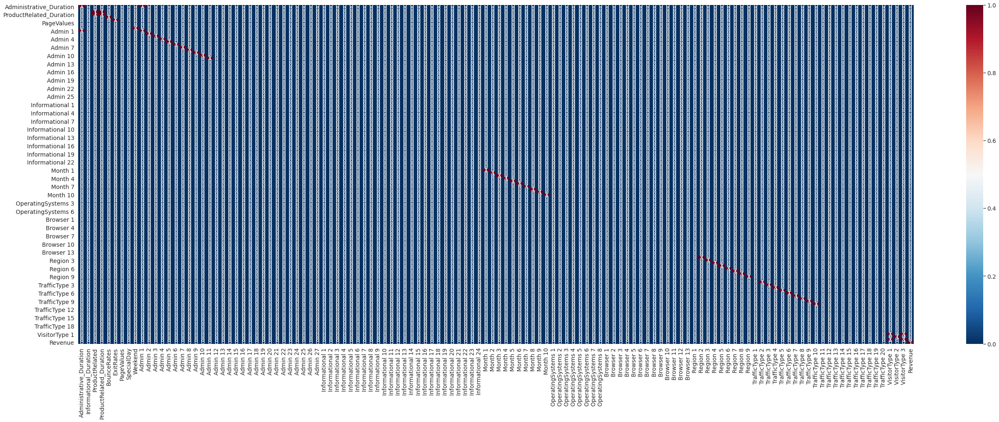

In [ ]:
# Select highly correlated features
# Using Pearson Correlation
plt.figure(figsize=(45,15))
sns.heatmap(cor>0.5, annot=True, cmap='RdBu_r')
plt.show()

## Feature Selection

Here is the final list of features that probabely are more informative for us and are recommended to be used for further processes. 

Threshold

we select features with more than certain amount of correlation. You can change the threshold to widen or narrow your desired scope.

### Top 50

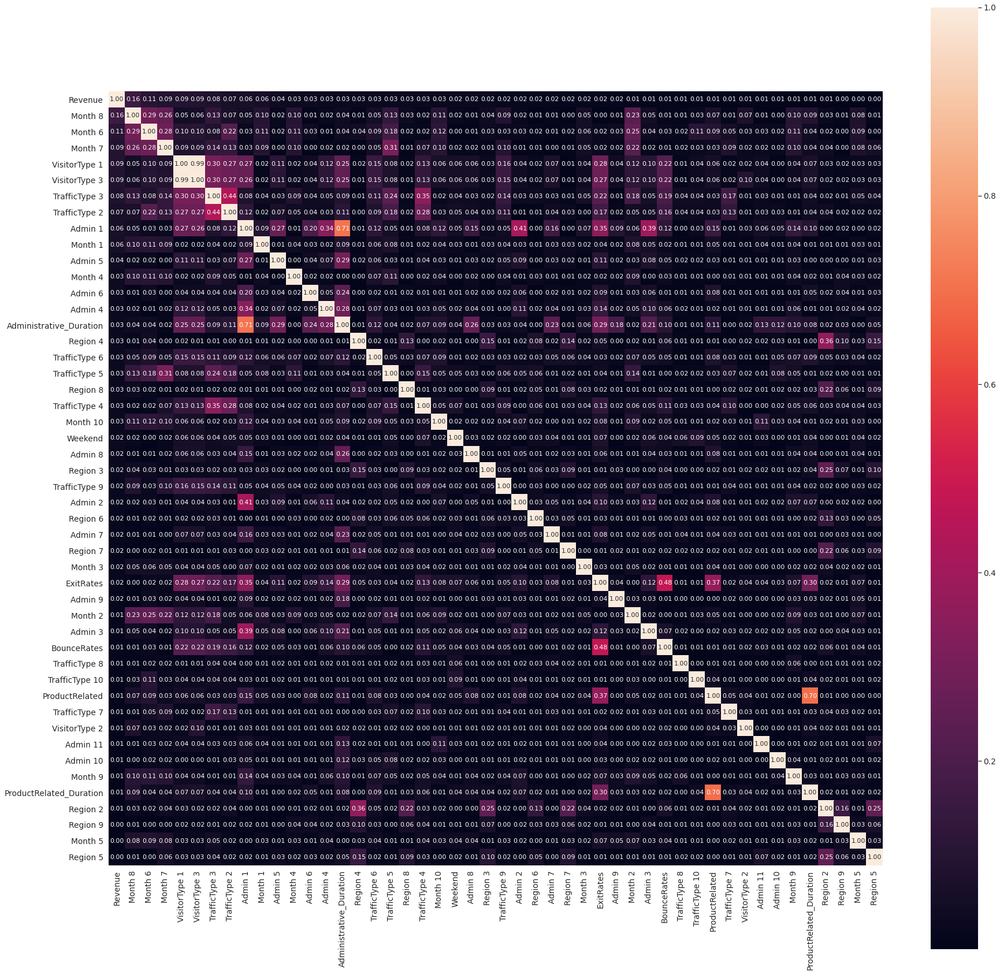

In [ ]:
# Plot the heatmap with all the variables, in correlation with 'target'
corrmat = np.abs(shop.corr())
k = 50 #number of variables for heatmap
cols = corrmat.nlargest(k, rev)[rev].index
cm = np.corrcoef(shop[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(30,30))  
hm = sns.heatmap(np.abs(cm), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 11}, yticklabels=cols.values, xticklabels=cols.values, ax=ax)
plt.show()

### Top 10

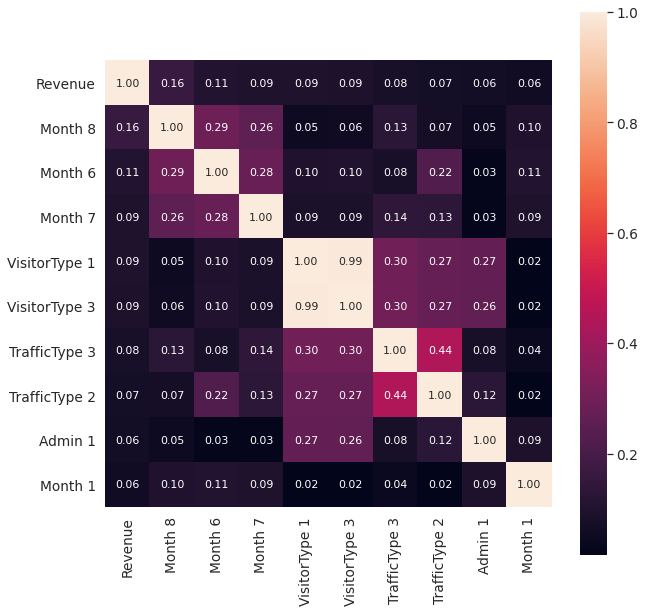

In [ ]:
# Plot the heatmap with all the variables, in correlation with 'target'
corrmat = np.abs(shop.corr())
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, rev)[rev].index
cm = np.corrcoef(shop[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(10,10))  
hm = sns.heatmap(np.abs(cm), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 11}, yticklabels=cols.values, xticklabels=cols.values, ax=ax)
plt.show()

### Threshold Filtering

In [ ]:
# Re-define the shop dataset filtered with the top 10 pairs with high correlations with target variables
shop = shop[cols]
shop

,Revenue,Month 8,Month 6,Month 7,VisitorType 1,VisitorType 3,TrafficType 3,TrafficType 2,Admin 1,Month 1
1,-1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
5,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
14,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
18,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
22,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
12310,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
12320,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
12322,-1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
12326,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
# For target variable correlation:
cor = np.abs(shop.corr())
cor = cor[rev]

threshold = 0.5 # Change the threshold for different results

# Filter out the high correlations with target variables
columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
        if cor.iloc[i] <= 0.05:
            if columns[i]:
                columns[i] = False

# Assign selected_column with columns
selected_columns = shop.columns[columns]

# Re-define shop with the selected columns
shop = shop[selected_columns]
shop

,Revenue,Month 8,Month 6,Month 7,VisitorType 1,VisitorType 3,TrafficType 3,TrafficType 2,Admin 1,Month 1
1,-1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
5,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
14,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
18,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
22,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
12310,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
12320,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
12322,-1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
12326,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


### Remove Features with High Correlation

In [ ]:
# Remove redundant variables

# There are no redundant features against target variables

# So, we will remove other redundant features

cor = np.abs(shop.corr())

threshold = 0.5 # change the threshold for different results

# Filter out the high correlations with target variables
columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
    for j in range(i+1, cor.shape[0]):
        if cor.iloc[i,j] >= 0.5:
            if columns[j]:
                columns[j] = False

# Assign selected_column with columns
selected_columns = shop.columns[columns]

# Re-define shop with the selected columns
shop = shop[selected_columns]
shop

,Revenue,Month 8,Month 6,Month 7,VisitorType 1,TrafficType 3,TrafficType 2,Admin 1,Month 1
1,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
14,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
18,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
12310,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12320,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
12322,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
12326,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Information Gain

In [ ]:
# Print shop dataframe
shop

,Revenue,Month 8,Month 6,Month 7,VisitorType 1,TrafficType 3,TrafficType 2,Admin 1,Month 1
1,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
14,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
18,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
12310,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12320,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
12322,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
12326,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
# Create Training and Test sets and apply scaling
# Scaler: This normalizes the data; reduces impact
# Features that have the greatest value will have 1, while lowest will have -1
shop_x = shop.drop(rev, axis=1)
shop_y = rev_df
X_train, X_test, y_train, y_test = train_test_split(shop_x, shop_y, random_state = 0)
shop_x

,Month 8,Month 6,Month 7,VisitorType 1,TrafficType 3,TrafficType 2,Admin 1,Month 1
1,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
14,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
18,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
22,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...
12310,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12320,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
12322,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
12326,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
# Print shop_y
shop_y

1       -1.0
5       -1.0
14      -1.0
18      -1.0
22      -1.0
        ... 
12310   -1.0
12320   -1.0
12322   -1.0
12326   -1.0
12329   -1.0
Name: Revenue, Length: 2543, dtype: float64

In [ ]:
# Print IG
feature_ig = mutual_info_classif(X_train, y_train, discrete_features=True)
# Sort the feature's IG
feature_ig.sort()
# Print IG on every new
res = dict(zip(shop_x.columns,feature_ig))
res

{'Admin 1': 0.009631021430484707,
 'Month 1': 0.010149460021623355,
 'Month 6': 0.0016675275951213604,
 'Month 7': 0.002366875119947792,
 'Month 8': 0.0015463020000750782,
 'TrafficType 2': 0.0077776710570721524,
 'TrafficType 3': 0.003342631127721535,
 'VisitorType 1': 0.0024554757779084446}

In [ ]:
# Declare top 5,10,15,20 IG
top5 = heapq.nlargest(5, res.keys(), key=lambda k: res[k])
top10 = heapq.nlargest(10, res.keys(), key=lambda k: res[k])
top15 = heapq.nlargest(15, res.keys(), key=lambda k: res[k])
top20 = heapq.nlargest(20, res.keys(), key=lambda k: res[k])
# print top 5 IG
top5

['Month 1', 'Admin 1', 'TrafficType 2', 'TrafficType 3', 'VisitorType 1']

In [ ]:
# Declare top 20 IG
shop = shop[top20]
shop

,Month 1,Admin 1,TrafficType 2,TrafficType 3,VisitorType 1,Month 7,Month 6,Month 8
1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
5,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
14,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
18,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
22,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
12310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12320,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
12322,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
12326,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
# Declare top 5 IG
shop = shop[top5]
shop

,Month 1,Admin 1,TrafficType 2,TrafficType 3,VisitorType 1
1,0.0,1.0,0.0,1.0,0.0
5,0.0,1.0,0.0,0.0,0.0
14,0.0,1.0,0.0,0.0,0.0
18,0.0,1.0,0.0,0.0,0.0
22,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...
12310,0.0,0.0,0.0,0.0,0.0
12320,0.0,1.0,1.0,0.0,0.0
12322,0.0,0.0,0.0,1.0,0.0
12326,0.0,1.0,0.0,0.0,0.0


## Data Exploration (last)

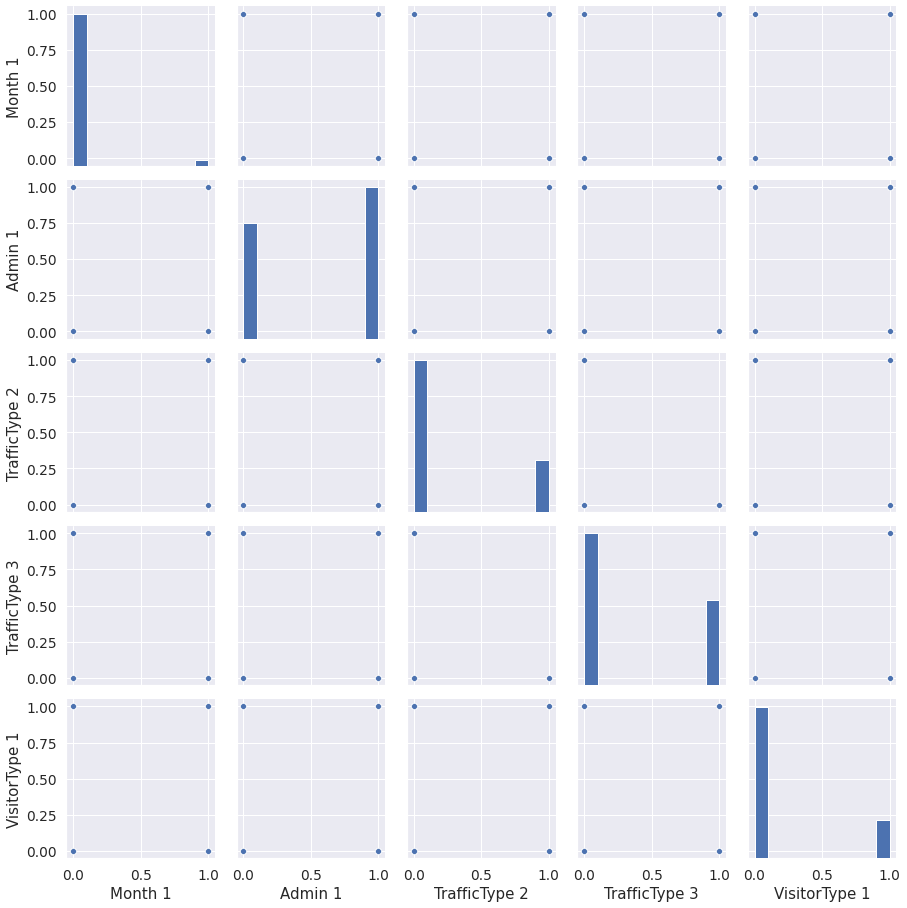

In [ ]:
# Create the default pairplot for the resulting variables
sns.pairplot(shop)

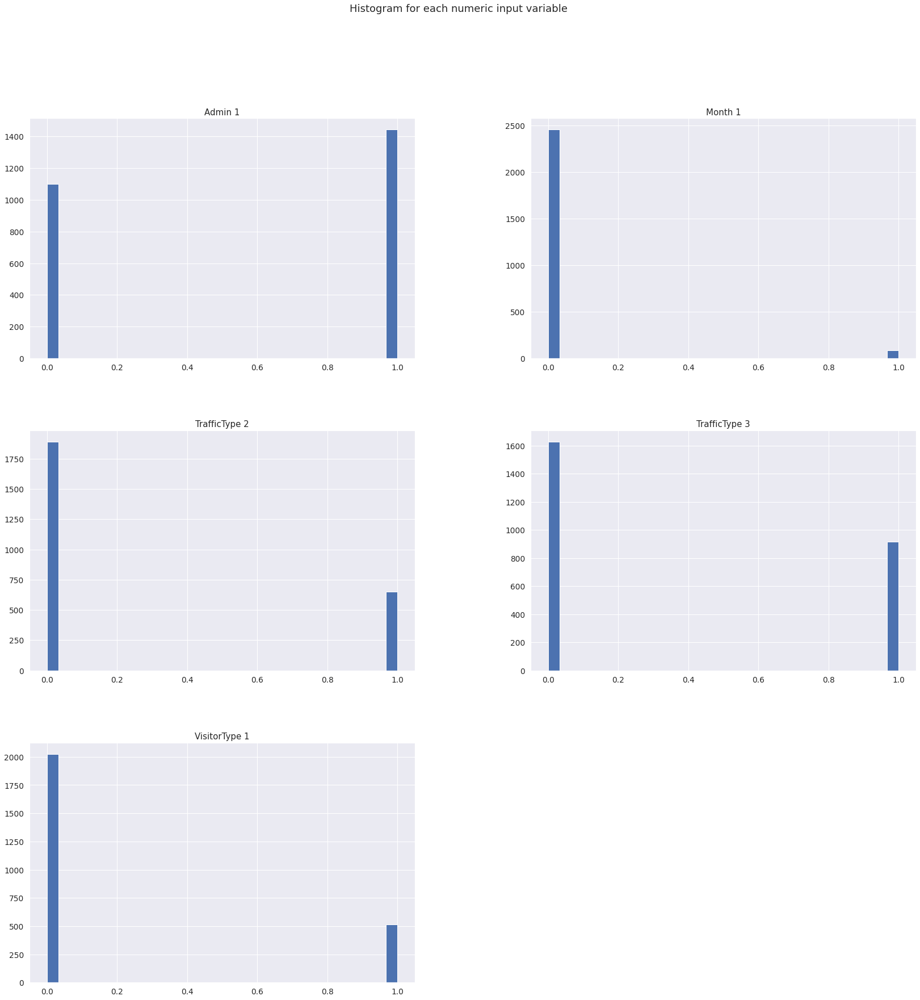

In [ ]:
# Print Histogram for the resulting variables
shop.hist(bins = 30, figsize = (28,28))
pl.suptitle("Histogram for each numeric input variable")
plt.savefig('shop_hist')
plt.show()

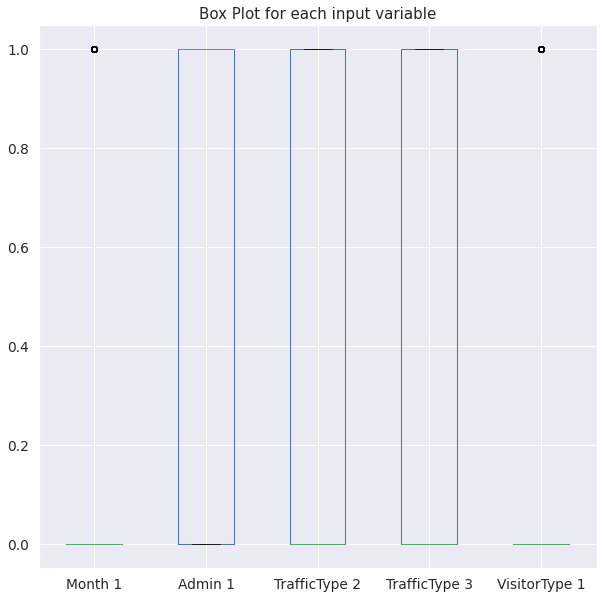

In [ ]:
# Print boxplot for the resulting variables
shop.plot.box(grid='True',figsize = (10,10), title = 'Box Plot for each input variable')

## Build Model

Decision Tree

In [ ]:
# Build models (Decision Tree)
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
print('Accuracy of Decision Tree on training: {:.2f}'
.format(dt.score(X_train, y_train)))
print('Accuracy of Decision Tree on test: {:.2f}'
.format(dt.score(X_test, y_test)))

Accuracy of Decision Tree on training: 0.96
Accuracy of Decision Tree on test: 0.97


K-NN

In [ ]:
#K-nearest Neighbours
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
print('Accuracy of K-NN on training: {:.2f}'
    .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN on test: {:.2f}'
    .format(knn.score(X_test, y_test)))

# it's perfect accuracy (this is bad)
# we should change split ratio since test > train

Accuracy of K-NN on training: 0.96
Accuracy of K-NN on test: 0.97


SVM

In [ ]:
# Support Vector Machine
svm = SVC()
svm.fit(X_train, y_train)
print('Accuracy of SVM on training: {:.2f}'
    .format(svm.score(X_train, y_train)))
print('Accuracy of SVM on test: {:.2f}'
    .format(svm.score(X_test, y_test)))

# if you have high training set accuracy, it is definitely overfitting

Accuracy of SVM on training: 0.96
Accuracy of SVM on test: 0.97


Confusion Matrix

In [ ]:
# Confusion matrix for Decision Tree
pred = dt.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[616   0]
 [ 20   0]]
              precision    recall  f1-score   support

        -1.0       0.97      1.00      0.98       616
         1.0       0.00      0.00      0.00        20

    accuracy                           0.97       636
   macro avg       0.48      0.50      0.49       636
weighted avg       0.94      0.97      0.95       636



In [ ]:
# Confusion matrix for kNN
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[616   0]
 [ 20   0]]
              precision    recall  f1-score   support

        -1.0       0.97      1.00      0.98       616
         1.0       0.00      0.00      0.00        20

    accuracy                           0.97       636
   macro avg       0.48      0.50      0.49       636
weighted avg       0.94      0.97      0.95       636



In [ ]:
# Confusion matrix for SVM
pred = svm.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[616   0]
 [ 20   0]]
              precision    recall  f1-score   support

        -1.0       0.97      1.00      0.98       616
         1.0       0.00      0.00      0.00        20

    accuracy                           0.97       636
   macro avg       0.48      0.50      0.49       636
weighted avg       0.94      0.97      0.95       636

